# <span style='color:#20185e'>Projet 3 - Préparez des données pour un organisme de santé publique</span>
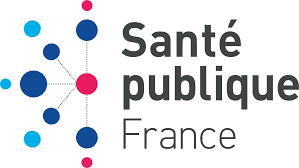

## <span style='background:pink'>Table des Matieres</span>

In [1]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

### <span style='background:pink'>1. Introduction</span>



**Mission**
*****
L’agence Santé France confie à l'entreprise la création d’un système de suggestion ou d’auto-complétion pour aider les usagers à remplir plus efficacement la base de données. Dans un premier temps, je dois me concentrer sur la prise en main des données, et d’abord les nettoyer et les explorer. 
Je suis missionnée sur le projet de nettoyage et d'exploration des données en interne, afin de déterminer la faisabilité de cette idée d’application de Santé publique France.




**Source**
*****
Le jeux de donnée est disponible à l'adresse : [Open Food Facts](https://world.openfoodfacts.org/)
*****
Les variables sont defineies à l'adresse : [Variables : Open Food Facts](https://world.openfoodfacts.org/data/data-fields.txt)


**Axes d'orientations**
*****

Mon travail va nous permettre de déterminer si ce jeu de données peut informer à la création d’un système de suggestion ou d’auto-complétion. La pré-analyse va consister à :
- Repérer des variables pertinentes
- Mettre en évidence les éventuelles valeurs manquantes parmis les variables pertinentes sélectionnées, avec au moins 3 méthodes de traitement adaptées aux variables concernées
- Identifier et traiter les éventuelles valeurs aberrantes de chaque variable.
- Sélectionner / créer des variables à l’aide d’une analyse multivariée. 
- Effectuer les tests statistiques appropriés pour vérifier la significativité des résultats.
- **Conclusions**

## <span style='background:pink'>2. Bibliothèques d'analyse Python</span>

In [2]:
#Cet environnement Python 3 est livré avec de nombreuses bibliothèques d'analyse utiles installées
#Par exemple, voici plusieurs packages utiles à charger

import numpy as np # algèbre linéaire
import pandas as pd # traitement des données, E/S de fichier CSV (par exemple pd.read_csv)
import sys

if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")
    


    
import matplotlib.pyplot as plt #Visualisations graphiques des données
import seaborn as sns
import matplotlib.gridspec as gridspec
%matplotlib inline
#!pip3 install plotly #installer plotly
import plotly.express as px 


import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler 
from sklearn.compose import make_column_transformer # Applique des transformateurs aux colonnes d'un tableau
from sklearn.preprocessing import OneHotEncoder #pour le recodage des variables catégorielles 
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import PowerTransformer
import matplotlib.patches as mpatches
import collections
import folium
import geopandas as gpd 
from mpl_toolkits.axes_grid1 import make_axes_locatable
from math import pi


from sklearn.impute import KNNImputer


from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import MinMaxScaler # pour effectuer la normalisations min-max
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, StratifiedKFold, train_test_split
from sklearn import decomposition, preprocessing
from sklearn import neighbors
#from missingpy import MissForest



# Versions de quelques librairies 
print('Version de quelques librairies utilisées :')
print('Python        : ' + sys.version)
print('NumPy         : ' + np.version.full_version)
print('Pandas        : ' + pd.__version__)
#print('Matplotlib    : ' + plt.__version__)
print('Seaborn    : ' + sns.__version__)
#print('Plotly    : ' + px.__version__)

import datetime
now  = datetime.datetime.now().isoformat()
print('Lancé le : ' + now)

Version de quelques librairies utilisées :
Python        : 3.11.3 (main, Apr  7 2023, 19:25:52) [Clang 14.0.0 (clang-1400.0.29.202)]
NumPy         : 1.24.3
Pandas        : 2.0.1
Seaborn    : 0.12.2
Lancé le : 2023-08-02T20:22:56.481812


## <span style='background:pink'>3. Analyse du jeux de données </span>

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [4]:
#importer les données 
#chargement du fichier
dfSante = pd.read_csv('openfoodfacts.csv',sep='\t',low_memory=False)

In [5]:
#Afficher les 5 premieres lignes
dfSante.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,no_nutriments,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_uk,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,NaN,NaN,Ferme t'y R'nao,ferme-t-y-r-nao,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:FR,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,États-Unis,"Bananas, vegetable oil (coconut oil, corn oil ...",NaN,NaN,NaN,NaN,NaN,28 g (1 ONZ),NaN,0.0,[ bananas -> en:bananas ]

In [6]:
#Afficher le nombre de lignes et de colonnes 
lign, col = dfSante.shape
print(f'Il y a {lign} lignes et {col} colonnes')

Il y a 320772 lignes et 162 colonnes


In [7]:
#Afficher les informations sur le dataset
dfSante.info(verbose= True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 162 columns):
 #    Column                                      Non-Null Count   Dtype  
---   ------                                      --------------   -----  
 0    code                                        320749 non-null  object 
 1    url                                         320749 non-null  object 
 2    creator                                     320770 non-null  object 
 3    created_t                                   320769 non-null  object 
 4    created_datetime                            320763 non-null  object 
 5    last_modified_t                             320772 non-null  object 
 6    last_modified_datetime                      320772 non-null  object 
 7    product_name                                303010 non-null  object 
 8    generic_name                                52795 non-null   object 
 9    quantity                                    104819 non-nu

In [8]:
#Le type des variables
dfSante.dtypes

code                                           object
url                                            object
creator                                        object
created_t                                      object
created_datetime                               object
last_modified_t                                object
last_modified_datetime                         object
product_name                                   object
generic_name                                   object
quantity                                       object
packaging                                      object
packaging_tags                                 object
brands                                         object
brands_tags                                    object
categories                                     object
categories_tags                                object
categories_fr                                  object
origins                                        object
origins_tags                

In [9]:
#variables qualitatives
dfSante.describe().T

,count,mean,std,min,25%,50%,75%,max
no_nutriments,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives_n,248939.0,1.936024,2.502019e+00,0.000000,0.000000e+00,1.000000,3.000000,3.100000e+01
ingredients_from_palm_oil_n,248939.0,0.019659,1.405241e-01,0.000000,0.000000e+00,0.000000,0.000000,2.000000e+00
ingredients_from_palm_oil,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ingredients_that_may_be_from_palm_oil_n,248939.0,0.055246,2.692074e-01,0.000000,0.000000e+00,0.000000,0.000000,6.000000e+00
ingredients_that_may_be_from_palm_oil,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_uk,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,261113.0,1141.914605,6.447154e+03,0.000000,3.770000e+02,1100.000000,1674.000000,3.251373e+06
energy-from-fat_100g,857.0,585.501214,7.128099e+02,0.000000,4.940000e+01,300.000000,898.000000,3.830000e+03
fat_100g,243891.0,12.730379,1.757875e+01,0.000000,0.000000e+00,5.000000,20.000000,7.142900e+02


In [10]:
#variables quantitatives
dfSante.describe(include = 'O').T

,count,unique,top,freq
code,320749,320749,0000000003087,1
url,320749,320749,http://world-fr.openfoodfacts.org/produit/0000...,1
creator,320770,3535,usda-ndb-import,169868
created_t,320769,189567,1489077120,20
created_datetime,320763,189568,2017-03-09T10:37:09Z,20
last_modified_t,320772,180495,1439141742,33
last_modified_datetime,320772,180495,2015-08-09T17:35:42Z,33
product_name,303010,221347,Ice Cream,410
generic_name,52795,38584,Pâtes alimentaires au blé dur de qualité supér...,201
quantity,104819,13826,500 g,4669


**Remarque**:
****
- certaines valeurs pour les variables '_100g' contiennent plus que 100g.
- des variables contiennent des valeurs négatives.
- les noms des variables contiennent des '-', valeur déconseillée dans la norme des noms des variables python. A remplacer par '_'.
- modifier les dates en format datetime 

<Axes: >

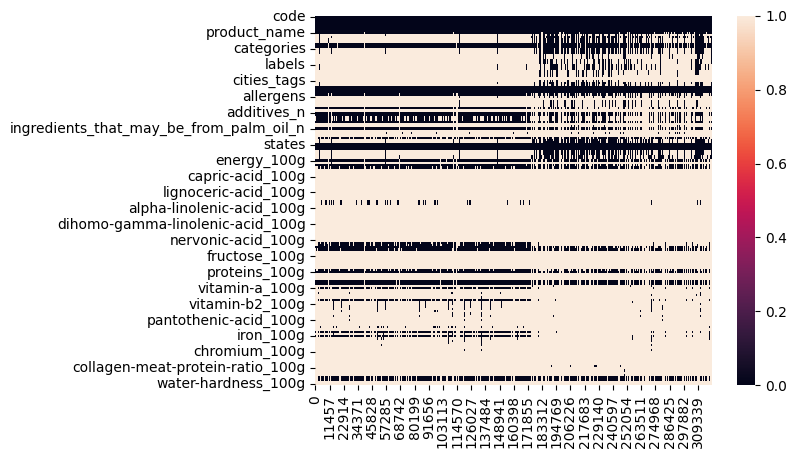

In [11]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
#Représentations des valeurs manquantes 
sns.heatmap(dfSante.isna().T)

In [12]:
# pays 
dfSante['countries'].value_counts().head(40)

countries
US                 169928
France              77292
en:FR               16979
Suisse              12314
Deutschland          6161
España               3688
United Kingdom       3247
United States        2248
en:CH                2150
en:BE                1538
en:GB                1507
Australia            1412
en:DE                1276
Россия               1151
en:ES                 947
Belgique              802
en:US                 761
en:AU                 642
en:IT                 596
en:CA                 569
France, Suisse        506
Portugal              504
Germany               389
Switzerland           360
Italia                331
Canada                318
Nederland             274
Belgium               233
Spain                 220
Belgique,France       219
en:CZ                 216
France,Suisse         212
en:FR, Suisse         204
en:AT                 190
en:TH                 175
en:NL                 168
Österreich            162
Brasil                157
Ma

Remarque : il y'a un pourcentage elevé de données manquantes sur la quasi-totalité des variables 
****
Avant de procéder au nettoyage propement dit des données, nous allons filtrer les données que en fonction des produits francais 

### <span style='colour:#20185e'>3.1. Filtrage des données</span>

In [13]:
#nouveau dataframe 
# on ne va garder que la France 
dfFrance = dfSante['countries'].str.lower().str.contains('fr', na=False, regex=False)
df = dfSante[dfFrance]
df.shape

(98468, 162)

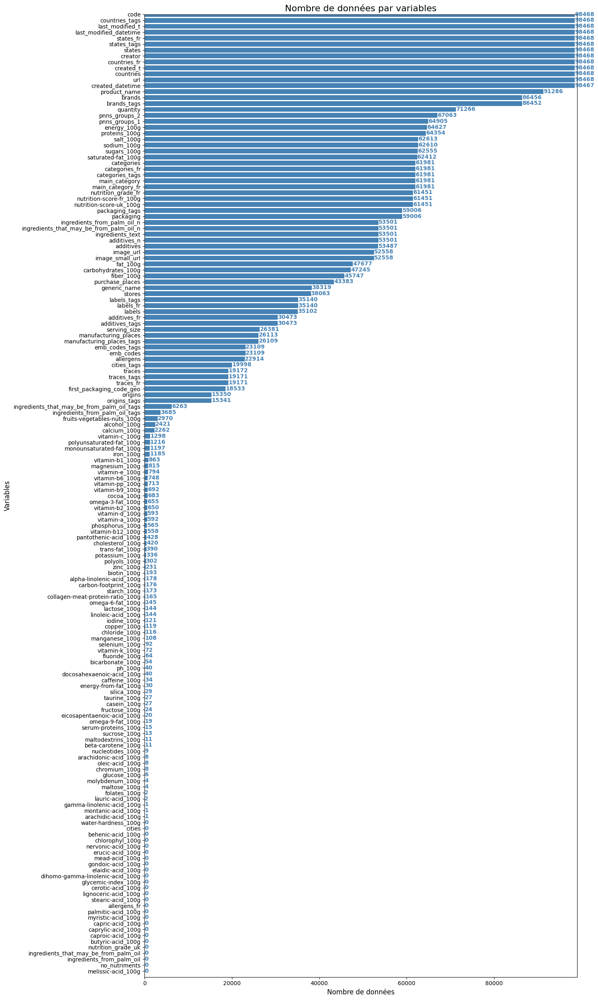

In [14]:
# Répartition des valeurs renseignées par variables
fig, ax = plt.subplots(figsize=(15, 25))

# Graphique ligne 1, colonne 1 ------------------
# Répartition des valeurs renseignées par variables
present = df.count()
present.sort_values(inplace=True)
ax.barh(y=present.index, width=present.values, color='SteelBlue')
for i, v in enumerate(present):
    ax.text(v + 5, i - .25, str(v), color='SteelBlue',
            fontsize=10, fontweight='bold')
ax.set_title('Nombre de données par variables', fontsize=16)
ax.set_xlabel('Nombre de données', fontsize=12)
ax.set_ylabel('Variables', fontsize=12)
ax.tick_params(labelsize=10)
ax.set_xlim([0, 99000])
ax.set_ylim([-1, 161])
ax.grid(False)
fig.tight_layout()
plt.savefig('repartition')
plt.show()

In [15]:
#Pourcentage des valeurs manquantes
size = df.shape
nan_values = df.isna().sum()
nan_values = nan_values.sort_values(ascending=True)*100/size[0]
nan_values

code                                            0.000000
states_tags                                     0.000000
states                                          0.000000
countries_tags                                  0.000000
states_fr                                       0.000000
last_modified_datetime                          0.000000
countries                                       0.000000
created_t                                       0.000000
creator                                         0.000000
url                                             0.000000
last_modified_t                                 0.000000
countries_fr                                    0.000000
created_datetime                                0.001016
product_name                                    7.293740
brands                                         12.198887
brands_tags                                    12.202949
quantity                                       27.625218
pnns_groups_2                  

In [16]:
#liste les valeurs manquantes dont le taux est plus de 80%
a_supp=[]
for i in nan_values.index:
    if (nan_values[i] > 80):
        a_supp.append(i)
len(a_supp)

102

- 96 variables avec plus de 90% de valeurs manquantes.
- 106 variables avec plus de75% de valeurs manquantes.

Conclusion : la suppression des variables très peu renseignées devra être effectuée.

**Suppréssions des varibales dont le taux de valeurs manquantes est a plus de 80%**

In [17]:
#Dataframe de travail
df_copy = df.copy()
df_copy=df_copy.loc[:,~df.columns.isin(a_supp)]
print(f'Il reste: {len(df_copy.columns.tolist())} Variables')
df_copy.columns.tolist()

Il reste: 60 Variables


['code',
 'url',
 'creator',
 'created_t',
 'created_datetime',
 'last_modified_t',
 'last_modified_datetime',
 'product_name',
 'generic_name',
 'quantity',
 'packaging',
 'packaging_tags',
 'brands',
 'brands_tags',
 'categories',
 'categories_tags',
 'categories_fr',
 'manufacturing_places',
 'manufacturing_places_tags',
 'labels',
 'labels_tags',
 'labels_fr',
 'emb_codes',
 'emb_codes_tags',
 'cities_tags',
 'purchase_places',
 'stores',
 'countries',
 'countries_tags',
 'countries_fr',
 'ingredients_text',
 'allergens',
 'serving_size',
 'additives_n',
 'additives',
 'additives_tags',
 'additives_fr',
 'ingredients_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil_n',
 'nutrition_grade_fr',
 'pnns_groups_1',
 'pnns_groups_2',
 'states',
 'states_tags',
 'states_fr',
 'main_category',
 'main_category_fr',
 'image_url',
 'image_small_url',
 'energy_100g',
 'fat_100g',
 'saturated-fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g'

Pour éviter des problèmes avec le langage python et respecter la norme des noms de variable, les **caractères '-'** seront **remplacés par '\_'** pour toutes les variables. 

In [18]:
cols_a_renommer = df_copy.columns[df_copy.columns.str.contains('-')]
print(f'{len(cols_a_renommer)} variables renommées')
df_copy.columns = df_copy.columns.str.replace('-', '_')


3 variables renommées


### <span style='colour:#20185e'>3.2. Vérification des doublons</span>

**code**: identifiant unique pour chaque produit

In [19]:
# Doublons pour la variable 'Code'
doublons_code = df_copy[df_copy.duplicated(['code'], keep=False)]
nb_doublons_code = doublons_code.shape[0]
print(
    f'Nombre de doublons sur le code produit : {int(nb_doublons_code/2)}')
doublons_code

Nombre de doublons sur le code produit : 0


,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,serving_size,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,nutrition_score_uk_100g


**Les doublons sur le dataframe**


In [20]:
doublons = df_copy[df_copy.duplicated(keep=False)]
nb_doublons = doublons.shape[0]
print(
    f'Nombre de doublons sur le data : {int(nb_doublons/2)}')
doublons

Nombre de doublons sur le data : 0


,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,serving_size,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,nutrition_score_uk_100g


### <span style='colour:#20185e'>3.3. Réduction des varibales sur les informations générales des produits </span>

In [21]:
#Description des données
df_copy.describe(include = 'O').T

,count,unique,top,freq
code,98468,98468,0000000003087,1
url,98468,98468,http://world-fr.openfoodfacts.org/produit/0000...,1
creator,98468,2637,openfoodfacts-contributors,29195
created_t,98468,98034,1415014731,6
created_datetime,98467,98033,2014-11-03T11:38:51Z,6
last_modified_t,98468,95200,1439141756,15
last_modified_datetime,98468,95200,2015-08-09T17:35:56Z,15
product_name,91286,74389,Huile d'olive vierge extra,62
generic_name,38319,27357,Pâtes alimentaires au blé dur de qualité supér...,201
quantity,71266,9630,500 g,3297


In [22]:
#Comparaison entre pnns_groups_1 et pnns_groups_2
df_gpe_produit = df_copy[df_copy['pnns_groups_1'] != df_copy['pnns_groups_2']]
df_gpe_produit = df_gpe_produit[['pnns_groups_1', 'pnns_groups_2']].head(50)
df_gpe_produit

,pnns_groups_1,pnns_groups_2
0,NaN,NaN
48,NaN,NaN
182,Cereals and potatoes,Legumes
184,Sugary snacks,Biscuits and cakes
187,Sugary snacks,Sweets
188,Beverages,Non-sugared beverages
190,NaN,NaN
191,NaN,NaN
194,NaN,NaN
224,NaN,NaN


**Remarque** : selon le descriptif des variables:
- **pnns_groups_1(13 valeurs uniques)** représente un groupe de produits 
- **pnns_groups_2(41 valeurs uniques)** est un sous groupe de ce premier groupe.
*****
**Conclusion** : On garde les deux variables.

In [23]:
#Comparaisons entre les countries/countries_fr/countries_tags
cond1 = df_copy['countries'] != df_copy['countries_tags']
cond2 = df_copy['countries'] != df_copy['countries_fr']


df_pays = df_copy[cond1 | cond2]
df_pays = df_pays[['countries', 'countries_tags', 'countries_fr']]
df_pays.head(100)

,countries,countries_tags,countries_fr
0,en:FR,en:france,France
46,France,en:france,France
48,en:FR,en:france,France
106,"France, US","en:france,en:united-states","France,États-Unis"
136,France,en:france,France
138,"France, US","en:france,en:united-states","France,États-Unis"
182,France,en:france,France
183,France,en:france,France
184,France,en:france,France
187,France,en:france,France


**Remarque** : 
- **countries_tags**(325 valeurs uniques) représente le nom des pays en anglais, 
- **countries_fr**(324 valeurs uniques) le nom des pays en francais 
- **countries**(661 valeurs uniques) les pays
****
Etant donné que les produits sont que des produits principalement filtrés que sur les produits francais, nous allons supprimer **countries_tags** et **countries_fr**


In [24]:
#suppressions des varibales: countries_tags et countries_fr
df_copy.drop(columns = ['countries_tags','countries_fr'], inplace = True)

In [25]:
#Comparaisons entre product_name et generic_name
df_n_produit = df_copy[df_copy['product_name'] != df_copy['generic_name']]
df_n_produit = df_n_produit[['product_name', 'generic_name']].head(50)
df_n_produit

,product_name,generic_name
0,Farine de blé noir,NaN
46,Filet de bœuf,NaN
48,NaN,NaN
106,Lion Peanut x2,NaN
136,Twix x2,NaN
138,Pack de 2 Twix,NaN
182,lentilles vertes,NaN
183,NaN,NaN
184,Biscuits sablés fourrage au cacao,Biscuits sablés déclassés fourrage au cacao
187,NaN,Bonbons acidulés Raisin Fraise


**Remarque** : 
- **product_name** : (74389 valeurs uniques) represente le nom des produits 
- **generic_name** : (27357 valeurs unqiues) représente le nom générique des produits 

**Conclusion** : on garde **product_name** etant donné de la quantité de données présentes  

In [26]:
#Suppréssions de "generic_name"

df_copy.drop(columns = ['generic_name'],inplace = True)
df_copy.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name', 'quantity',
       'packaging', 'packaging_tags', 'brands', 'brands_tags', 'categories',
       'categories_tags', 'categories_fr', 'manufacturing_places',
       'manufacturing_places_tags', 'labels', 'labels_tags', 'labels_fr',
       'emb_codes', 'emb_codes_tags', 'cities_tags', 'purchase_places',
       'stores', 'countries', 'ingredients_text', 'allergens', 'serving_size',
       'additives_n', 'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags', 'states_fr',
       'main_category', 'main_category_fr', 'image_url', 'image_small_url',
       'energy_100g', 'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       

In [27]:
#Comparaisons entre brands et brands_tags
df_b_produit = df_copy[df_copy['brands'] != df_copy['brands_tags']]
df_b_produit = df_b_produit[['brands', 'brands_tags']].head(50)
df_b_produit

,brands,brands_tags
0,Ferme t'y R'nao,ferme-t-y-r-nao
46,NaN,NaN
48,NaN,NaN
106,Sunridge,sunridge
136,NaN,NaN
138,"Twix, Lundberg","twix,lundberg"
182,Bertrand Lejeune,bertrand-lejeune
183,A&W,a-w
184,St Michel,st-michel
187,NaN,NaN


**Remarque** : 
- **brands**(21026 valeurs uniques) et **brands_tags**(16208 valeurs uniques) 

**Conclusion** : on garde **brands**

In [28]:
#Suppréssions de "brands_tags"

df_copy.drop(columns = ['brands_tags'],inplace = True)
df_copy.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name', 'quantity',
       'packaging', 'packaging_tags', 'brands', 'categories',
       'categories_tags', 'categories_fr', 'manufacturing_places',
       'manufacturing_places_tags', 'labels', 'labels_tags', 'labels_fr',
       'emb_codes', 'emb_codes_tags', 'cities_tags', 'purchase_places',
       'stores', 'countries', 'ingredients_text', 'allergens', 'serving_size',
       'additives_n', 'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags', 'states_fr',
       'main_category', 'main_category_fr', 'image_url', 'image_small_url',
       'energy_100g', 'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 

In [29]:
#Suppréssions de "categories_tags" et "categories_fr"

df_copy.drop(columns = ['categories_tags','categories_fr'],inplace = True)
df_copy.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name', 'quantity',
       'packaging', 'packaging_tags', 'brands', 'categories',
       'manufacturing_places', 'manufacturing_places_tags', 'labels',
       'labels_tags', 'labels_fr', 'emb_codes', 'emb_codes_tags',
       'cities_tags', 'purchase_places', 'stores', 'countries',
       'ingredients_text', 'allergens', 'serving_size', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags', 'states_fr',
       'main_category', 'main_category_fr', 'image_url', 'image_small_url',
       'energy_100g', 'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition_score_fr_100g', 'nutritio

In [30]:
#Comparaisons entre categories  et main_category_fr
df_c_produit = df_copy[df_copy['categories'] != df_copy['main_category_fr']]
df_c_produit = df_c_produit[['categories', 'main_category_fr']].head(50)
df_c_produit

,categories,main_category_fr
0,NaN,NaN
46,Filet de bœuf,Filet-de-boeuf
48,NaN,NaN
106,NaN,NaN
136,NaN,NaN
138,NaN,NaN
182,"Aliments et boissons à base de végétaux,Alimen...",Aliments et boissons à base de végétaux
183,Root bier,Root-bier
184,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Sablés",Sablés
188,"Aliments et boissons à base de végétaux,Boisso...",Thés


Suivant la logique et la definition des variables, nous remarquons qu'il existe plusieurs varibales redondantes qui ne seront pas utilisées pour la suite du projet.
***
Les différentes **variables retenues** sont: 

- code : identifiant unique du produit.
- product_name : nom du produit, indispensable.
- countries : liste des pays où le produit est vendu (cible : recommandation en France).
- pnns_groups_1 : groupe de classement (pourra permettre de rechercher les produits par groupe de produits
- pnns_groups_2 : sous-groupe de classement du produit (permet de savoir si le produit est autorisé, interdit ou à contrôler).
- categories : catégorie des produits 
- additives : liste des additifs alimentaires.
- nutrition_grade_fr: note du nutri-score de A à E.
- brands : marque (permet à l'utilisateur de retrouver le produit).

In [31]:
#Les variables retenues sur les informations générales des produits
col_valgen_retenue = ['code', 'product_name','countries', 
                   'pnns_groups_1','pnns_groups_2','categories','additives','nutrition_grade_fr','brands']
col_valgen_retenue

['code',
 'product_name',
 'countries',
 'pnns_groups_1',
 'pnns_groups_2',
 'categories',
 'additives',
 'nutrition_grade_fr',
 'brands']

les différentes **Variables écartées** sont:

- url : url sur Open Food Facts.
- image_small_url : petite photographie du produit (redondant avec image_url, même taux de remplissage).
- creator/created_t/created_datetime/last_modified_t: dates liées au produit.
- serving_quantity :portion.
- manufacturing_places/manufacturing_places_tags : lieu de fabrication ou transformation.
- labels/labels_fr/labels_tags : label, certification.
- emb_codes/emb_codes_tags : code de l'emballage.
- cities/cities_tags : lieu de l'emballage.
- purchase_places : lieu d'achat.
- serving_size : proportion en g.
- ingredients_text : liste des ingrédients.
- main_category : redondant avec main_category_fr.
- states/states_fr/states_tags : état de complétude du produit.
- main_category_fr : catégorie principale de la sous-catégorie 'categories'.

In [32]:
#descriptions des données quantitatives
df_copy[col_valgen_retenue].describe(include = 'O').T

,count,unique,top,freq
code,98468,98468,0000000003087,1
product_name,91286,74389,Huile d'olive vierge extra,62
countries,98468,661,France,77292
pnns_groups_1,64905,13,unknown,12493
pnns_groups_2,67063,41,unknown,12493
categories,61981,26660,"Snacks sucrés,Biscuits et gâteaux,Biscuits",291
additives,53487,45592,[ semoule-de-ble-dur-de-qualite-superieure ->...,197
nutrition_grade_fr,61451,5,d,17004
brands,86456,21026,Carrefour,2838


### <span style='colour:#20185e'>3.4. Réduction des varibales sur les informations liées aux mineraux, nutriments ... des produits </span>

In [33]:
#Descriptions des données 
df_copy.describe().T

,count,mean,std,min,25%,50%,75%,max
additives_n,53501.0,1.855853,2.560448,0.0,0.000000,1.0000,3.0000,31.0
ingredients_from_palm_oil_n,53501.0,0.069830,0.258577,0.0,0.000000,0.0000,0.0000,2.0
ingredients_that_may_be_from_palm_oil_n,53501.0,0.148259,0.450752,0.0,0.000000,0.0000,0.0000,5.0
energy_100g,64627.0,1171.627765,12832.547880,0.0,427.000000,1035.0000,1649.0000,3251373.0
fat_100g,47677.0,13.340016,16.939263,0.0,1.300000,6.8000,21.0000,380.0
saturated_fat_100g,62412.0,5.426280,8.536277,0.0,0.300000,2.0000,7.4000,210.0
carbohydrates_100g,47245.0,27.749530,27.411755,0.0,4.000000,14.5000,53.0000,190.0
sugars_100g,62555.0,13.431192,19.087523,-0.1,1.000000,4.1000,17.8000,105.0
fiber_100g,45747.0,2.559144,4.633990,0.0,0.000000,1.3900,3.2000,178.0
proteins_100g,64354.0,7.754553,7.887170,0.0,1.800000,6.0000,11.0000,100.0


**Remarque** : nous gardons les champs se terminant par _100g qui correspondent à la quantité d'un nutriment (en g) pour 100 g ou 100 ml de produit.


In [34]:
cols_nutriments = df_copy.columns[df_copy.columns.str.endswith('_100g')]
cols_nutriments = cols_nutriments.to_list()
cols_nutriments

['energy_100g',
 'fat_100g',
 'saturated_fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g',
 'nutrition_score_fr_100g',
 'nutrition_score_uk_100g']

In [35]:
#Comparaison entre "nutrition_score_fr_100g" et "nutrition_score_uk_100g"
df_nutri_produit = df_copy[df_copy['nutrition_score_fr_100g'] != df_copy['nutrition_score_uk_100g']]
df_nutri_produit = df_nutri_produit[['nutrition_score_fr_100g', 'nutrition_score_uk_100g']].head(100)
df_nutri_produit


,nutrition_score_fr_100g,nutrition_score_uk_100g
0,NaN,NaN
46,NaN,NaN
48,NaN,NaN
136,NaN,NaN
138,NaN,NaN
182,NaN,NaN
183,NaN,NaN
184,NaN,NaN
187,NaN,NaN
188,NaN,NaN


**Remarque**: 
- **nutrition_score_fr_100g** : Nutri-Score - Score nutritionnel dérivé du score FSA britannique et adapté au marché français (formule définie par l'équipe du Professeur Hercberg)
- **nutrition_score_uk_100g** :score nutritionnel défini par l'administration britannique des normes alimentaires (FSA)

**Conclusion** : on garde **nutrition_score_fr_100g**


In [36]:
# Suppression de la variable "nutrition_score_uk_100g" 
cols_nutriments.remove('nutrition_score_uk_100g')

In [37]:
#Difference entre "ingredients_from_palm_oil_n" et "ingredients_that_may_be_from_palm_oil_n"

In [38]:
#Comparaison 
df_oil_produit = df_copy[df_copy['ingredients_from_palm_oil_n'] != df_copy['ingredients_that_may_be_from_palm_oil_n']]
df_oil_produit = df_oil_produit[['ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']].head(50)
df_oil_produit

,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n
0,NaN,NaN
46,NaN,NaN
48,NaN,NaN
136,NaN,NaN
138,NaN,NaN
183,NaN,NaN
184,0.0,1.0
187,NaN,NaN
190,NaN,NaN
191,NaN,NaN


- **ingredients_from_palm_oil_n** nombre d'ingrédients d'huile de palme.
- **ingredients_that_may_be_from_palm_oil_n** : nombre d'ingrédients qui peuvent être de l'huile de palme.

**Conclusion** : on garde les deux variables en les regroupement en une seule variable 'ingredients_from_palm_oil'

In [39]:
#Ajout aux variables nutriments : 'additives_n', 'ingredients_from_palm_oil_n' et 'ingredients_that_may_be_from_palm_oil_n'
df_copy['ingredients_from_palm_oil'] = df_copy['ingredients_from_palm_oil_n'] + df_copy['ingredients_that_may_be_from_palm_oil_n']
df_copy.drop(columns = ['ingredients_from_palm_oil_n','ingredients_that_may_be_from_palm_oil_n'],inplace = True)
cols_nutriments.append('additives_n')
cols_nutriments.append('ingredients_from_palm_oil')
cols_nutriments

['energy_100g',
 'fat_100g',
 'saturated_fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g',
 'nutrition_score_fr_100g',
 'additives_n',
 'ingredients_from_palm_oil']

In [40]:
#difference entre salt_100g et sodium_100g
df_s_produit = df_copy[df_copy['salt_100g'] != df_copy['sodium_100g']]
df_s_produit = df_s_produit[['salt_100g', 'sodium_100g']].head(50)
df_s_produit

,salt_100g,sodium_100g
0,NaN,NaN
46,NaN,NaN
48,NaN,NaN
106,0.09652,0.038000
136,NaN,NaN
138,NaN,NaN
182,NaN,NaN
183,NaN,NaN
184,NaN,NaN
187,NaN,NaN


**Remarque** : d'aprés nos recherches Le sodium est l’un des minéraux constituants du sel : 1 g de sel étant composé de 400 mg de Na et 600 mg de Cl. On ne le retrouve naturellement dans la nature que dans des composés chimiques.

**Conclusion** : on garde le sel "salt_100g"

In [41]:
#suppréssion de la variable sodium_100g
cols_nutriments.remove('sodium_100g')
cols_nutriments

['energy_100g',
 'fat_100g',
 'saturated_fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'nutrition_score_fr_100g',
 'additives_n',
 'ingredients_from_palm_oil']

**Bilan des variables sur les nuntriments, minéraux ...** : 
- energy_100g : énergie nutritionnelle en kJ pour 100g.
- fat_100g : x g de lipides pour 100g ou 100ml de produit.
- saturated_fat_100g : x g d'acides gras saturés pour 100g ou 100ml de produit.
- carbohydrates_100g : x g de glucides pour 100g ou 100ml de produit.
- sugars_100g : x g de sucre pour 100g ou 100ml de produit.
- fiber_100g : x g de fibres pour 100g ou 100ml de produit.
- proteins_100g : x g de protéines pour 100g ou 100ml de produit.
- salt_100g : x g de sel pour 100g ou 100ml de produit. 
- additives_n : nombre d'additives
- ingredients_from_palm_oil : nombre d'ingrédients d'huile de palme.

## <span style='background:pink'>4. Bilan du jeux de données </span>


### <span style='colour:#20185e'>4.1. Les variables retenues du dataset </span>
    

In [42]:
col_a_garder = col_valgen_retenue+cols_nutriments
print(f'Il reste {len(col_a_garder)} variables')
col_a_garder 

Il reste 20 variables


['code',
 'product_name',
 'countries',
 'pnns_groups_1',
 'pnns_groups_2',
 'categories',
 'additives',
 'nutrition_grade_fr',
 'brands',
 'energy_100g',
 'fat_100g',
 'saturated_fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'nutrition_score_fr_100g',
 'additives_n',
 'ingredients_from_palm_oil']

In [43]:
#Dataframe temporaire de travail
df_travail = df_copy[col_a_garder]
print(f'Il reste {df_travail.shape[0]} lignes et {df_travail.shape[1]} colonnes')

Il reste 98468 lignes et 20 colonnes


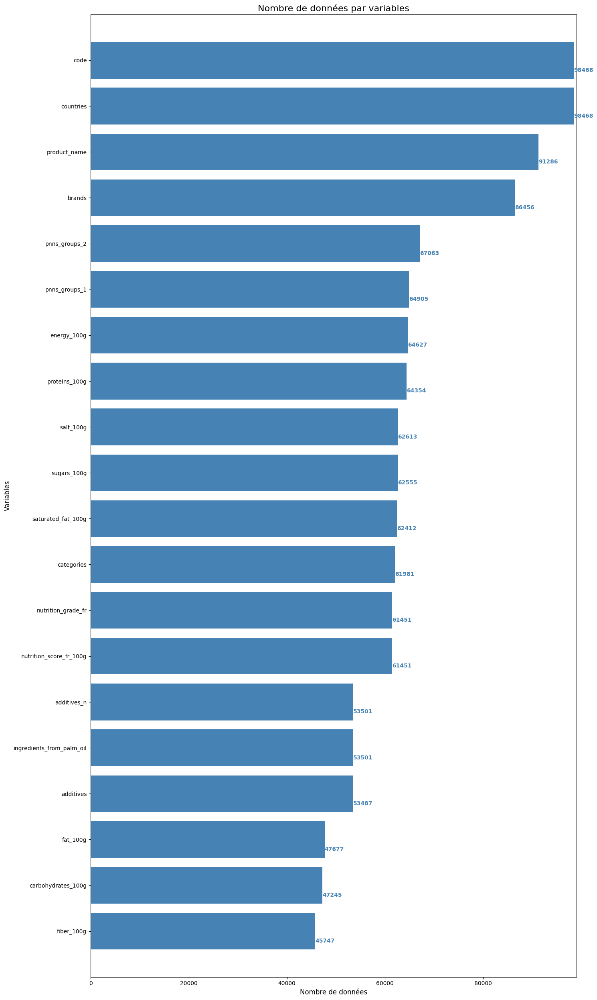

In [44]:
# Répartition des valeurs renseignées par variables
fig, ax = plt.subplots(figsize=(15, 25))

# Graphique ligne 1, colonne 1 ------------------
# Répartition des valeurs renseignées par variables
present = df_travail.count()
present.sort_values(inplace=True)
ax.barh(y=present.index, width=present.values, color='SteelBlue')
for i, v in enumerate(present):
    ax.text(v + 5, i - .25, str(v), color='SteelBlue',
            fontsize=10, fontweight='bold')
ax.set_title('Nombre de données par variables', fontsize=16)
ax.set_xlabel('Nombre de données', fontsize=12)
ax.set_ylabel('Variables', fontsize=12)
ax.tick_params(labelsize=10)
ax.set_xlim([0, 99000])
ax.set_ylim([-1, 20])
ax.grid(False)
fig.tight_layout()
plt.show()

<Axes: >

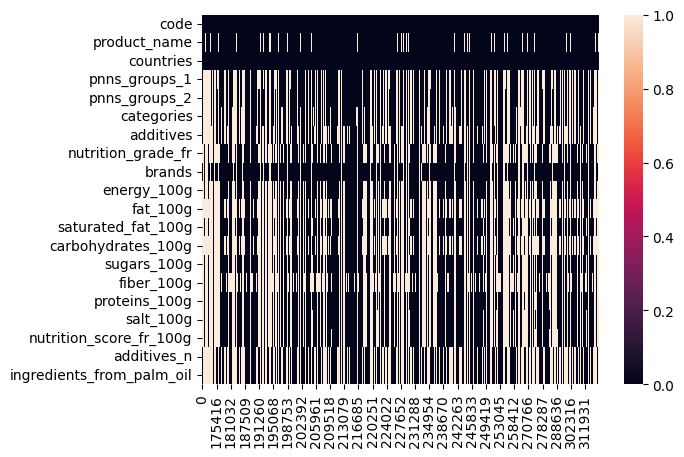

In [45]:
#Répartitions des valeurs manquantes 
sns.heatmap(df_travail.isna().T)

In [46]:
df_travail.describe(include='O').T

,count,unique,top,freq
code,98468,98468,0000000003087,1
product_name,91286,74389,Huile d'olive vierge extra,62
countries,98468,661,France,77292
pnns_groups_1,64905,13,unknown,12493
pnns_groups_2,67063,41,unknown,12493
categories,61981,26660,"Snacks sucrés,Biscuits et gâteaux,Biscuits",291
additives,53487,45592,[ semoule-de-ble-dur-de-qualite-superieure ->...,197
nutrition_grade_fr,61451,5,d,17004
brands,86456,21026,Carrefour,2838


### <span style='colour:#20185e'>4.2. Suppressions des 'product_name' non-renseignés </span>


In [47]:
df_travail.dropna(subset=['product_name'], inplace=True)
print(f'Il reste {df_travail.shape[0]} lignes et {df_travail.shape[1]} colonnes')

Il reste 91286 lignes et 20 colonnes


In [48]:
# Nom de produit de moins de 3 caractères?
df_travail[df_travail['product_name'].str.len() < 3]

,code,product_name,countries,pnns_groups_1,pnns_groups_2,categories,additives,nutrition_grade_fr,brands,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g,additives_n,ingredients_from_palm_oil
625,00052337,,"France,United Kingdom",NaN,NaN,NaN,NaN,NaN,M&S,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13086,0016165003060,Fe,en:FR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
90235,0075707098155,H,en:FR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
174380,0951600600537,ok,en:FR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
191776,3061990141415,bn,en:FR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192547,3080216039657,K,en:FR,NaN,NaN,NaN,NaN,NaN,Kronenbourg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
196749,3168930501732,3d,en:FR,NaN,NaN,NaN,NaN,NaN,Benenuts gout bacon,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201117,3222474768546,P,en:FR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
236774,3527615523313,O,France,NaN,Alcoholic beverages,"Vins français,Pays d'Oc",[ 70-cabernet-sauvignon -> fr:70-cabernet-sau...,NaN,Gilles Louvet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
242146,3564700523049,Hf,en:FR,NaN,NaN,NaN,NaN,NaN,Gfd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Suppréssions des noms de produits de moins de 3 caracteres**

In [49]:

df_travail= df_travail.drop(
    df_travail[df_travail['product_name'].str.len() < 3].index)

In [50]:
print(f'Il reste {df_travail.shape[0]} lignes et {df_travail.shape[1]} colonnes')

Il reste 91265 lignes et 20 colonnes


In [51]:
#Liste des valeurs uniques de 'pnns_groups_1'
df_travail['pnns_groups_1'].unique().tolist()

[nan,
 'unknown',
 'Cereals and potatoes',
 'Sugary snacks',
 'Beverages',
 'Fish Meat Eggs',
 'Composite foods',
 'Fruits and vegetables',
 'Milk and dairy products',
 'Salty snacks',
 'Fat and sauces',
 'fruits-and-vegetables',
 'sugary-snacks',
 'cereals-and-potatoes']

In [52]:
#Liste des valeurs uniques de 'pnns_groups_2'
df_travail['pnns_groups_2'].unique().tolist()

[nan,
 'unknown',
 'Legumes',
 'Biscuits and cakes',
 'Non-sugared beverages',
 'Sweetened beverages',
 'Meat',
 'One-dish meals',
 'Soups',
 'Chocolate products',
 'Cheese',
 'Sweets',
 'Sandwich',
 'Appetizers',
 'Dressings and sauces',
 'Dried fruits',
 'Nuts',
 'Breakfast cereals',
 'Pizza pies and quiche',
 'Fruits',
 'Fruit juices',
 'Fats',
 'Alcoholic beverages',
 'Cereals',
 'Vegetables',
 'Bread',
 'Processed meat',
 'vegetables',
 'Ice cream',
 'Fish and seafood',
 'pastries',
 'Milk and yogurt',
 'Dairy desserts',
 'Tripe dishes',
 'Artificially sweetened beverages',
 'Fruit nectars',
 'Potatoes',
 'Eggs',
 'Salty and fatty products',
 'fruits',
 'legumes',
 'cereals']

In [53]:
df_travail.loc[df_travail['pnns_groups_2'] == 'fruits']

,code,product_name,countries,pnns_groups_1,pnns_groups_2,categories,additives,nutrition_grade_fr,brands,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g,additives_n,ingredients_from_palm_oil
191726,3061432138003,Framboises surgelés,France,fruits-and-vegetables,fruits,Framboises surgelées,[ framboises-100 -> fr:framboises-100 ] [ f...,NaN,PassionFroid,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
206128,3250391020300,Framboises entières,France,fruits-and-vegetables,fruits,Framboises surgelées,[ 100-framboises-willamette -> fr:100-framboi...,a,"Adélie,Intermarché",181.0,0.5,0.10,5.4,5.4,NaN,1.6,0.0100,-4.0,0.0,0.0
209690,3256220369039,Framboises entières,France,fruits-and-vegetables,fruits,Framboises surgelées,[ framboises-entieres -> fr:framboises-entier...,a,U,348.0,0.0,0.00,14.0,12.0,9.4,2.0,0.0000,-8.0,0.0,0.0
210584,3256222963495,Framboises en brisure surgelées,France,fruits-and-vegetables,fruits,Framboises surgelées,[ framboises-en-brisure -> fr:framboises-en-b...,a,U,174.0,0.0,0.00,7.0,6.0,4.7,1.0,0.0000,-9.0,0.0,0.0
211560,3256225426911,Myrtilles sauvages,France,fruits-and-vegetables,fruits,Myrtilles surgelées,[ myrtilles-sauvages-100 -> fr:myrtilles-sauv...,a,U,255.0,0.5,0.00,12.0,7.9,2.5,0.6,0.0100,-7.0,0.0,0.0
212796,3257982134675,Framboises entières,France,fruits-and-vegetables,fruits,Framboises surgelées,[ 100-framboises-entieres -> fr:100-framboise...,a,Cora,146.0,0.0,0.00,4.5,4.5,2.5,1.4,0.0100,-8.0,0.0,0.0
217373,3263859929510,Framboises Entières,France,fruits-and-vegetables,fruits,"Aliments et boissons à base de végétaux,Alimen...",[ framboises-100 -> fr:framboises-100 ] [ f...,a,Leader Price,184.0,0.3,0.10,7.0,5.0,5.3,1.3,0.0200,-9.0,0.0,0.0
217374,3263859929619,Cocktail de Fruits Rouges,France,fruits-and-vegetables,fruits,"Aliments et boissons à base de végétaux,Alimen...",[ framboises-30 -> fr:framboises-30 ] [ fra...,a,Leader Price,240.0,0.5,0.30,9.6,6.7,5.1,1.0,0.0000,-9.0,0.0,0.0
218762,3270160015924,Melon en Billes,France,fruits-and-vegetables,fruits,Fruits surgelés,[ melon-100 -> fr:melon-100 ] [ melon -> fr...,a,Picard,219.0,0.5,0.50,11.1,10.8,1.4,1.2,0.0100,-4.0,0.0,0.0
218772,3270160031689,Mangues en tranches sans peau,France,fruits-and-vegetables,fruits,"Surgelés,Fruits surgelés,Mangues surgelées",[ mangues-en-tranches-sans-peau -> fr:mangues...,a,Picard,264.0,0.1,0.01,14.3,13.1,1.8,0.7,0.0100,-5.0,0.0,0.0


**Pour homogénieser les données nous allons remplacer '-' par espace ' ' et tout passer en minuscule**

**pnns_groups_1**

In [54]:
# Remplacement du tiret par un espace
df_travail['pnns_groups_1'] = df_travail['pnns_groups_1'].str.replace('-', " ")
# Tout passer en minuscules
df_travail['pnns_groups_1'] = df_travail['pnns_groups_1'].str.lower().apply(str)
df_travail['pnns_groups_1'].sort_values().unique().tolist()

['beverages',
 'cereals and potatoes',
 'composite foods',
 'fat and sauces',
 'fish meat eggs',
 'fruits and vegetables',
 'milk and dairy products',
 'nan',
 'salty snacks',
 'sugary snacks',
 'unknown']

**pnns_groups_2**

In [55]:
# Remplacement du tiret par un espace
df_travail['pnns_groups_2'] = df_travail['pnns_groups_2'].str.replace('-', " ")
# Tout passer en minuscules
df_travail['pnns_groups_2'] = df_travail['pnns_groups_2'].str.lower().apply(str)
df_travail['pnns_groups_2'].sort_values().unique().tolist()

['alcoholic beverages',
 'appetizers',
 'artificially sweetened beverages',
 'biscuits and cakes',
 'bread',
 'breakfast cereals',
 'cereals',
 'cheese',
 'chocolate products',
 'dairy desserts',
 'dressings and sauces',
 'dried fruits',
 'eggs',
 'fats',
 'fish and seafood',
 'fruit juices',
 'fruit nectars',
 'fruits',
 'ice cream',
 'legumes',
 'meat',
 'milk and yogurt',
 'nan',
 'non sugared beverages',
 'nuts',
 'one dish meals',
 'pastries',
 'pizza pies and quiche',
 'potatoes',
 'processed meat',
 'salty and fatty products',
 'sandwich',
 'soups',
 'sweetened beverages',
 'sweets',
 'tripe dishes',
 'unknown',
 'vegetables']

### <span style='colour:#20185e'>4.3. Remplacer des valeurs négatives par Nan </span>

In [56]:
#descriptions des données
df_travail.describe().T

,count,mean,std,min,25%,50%,75%,max
energy_100g,64256.0,1170.838030,12866.586028,0.0,427.00,1035.0000,1649.0000,3251373.0
fat_100g,47325.0,13.338781,16.943512,0.0,1.30,6.8000,21.0000,380.0
saturated_fat_100g,62059.0,5.427837,8.544796,0.0,0.30,2.0000,7.4000,210.0
carbohydrates_100g,46892.0,27.732681,27.415394,0.0,4.00,14.5000,53.0000,190.0
sugars_100g,62195.0,13.423762,19.082357,-0.1,1.00,4.1000,17.7400,105.0
fiber_100g,45522.0,2.558317,4.635392,0.0,0.00,1.3000,3.2000,178.0
proteins_100g,63984.0,7.763879,7.893201,0.0,1.80,6.0000,11.0000,100.0
salt_100g,62253.0,1.159808,4.302457,0.0,0.08,0.5588,1.2446,211.0
nutrition_score_fr_100g,61107.0,8.680315,9.044474,-15.0,1.00,9.0000,15.0000,40.0
additives_n,53430.0,1.856466,2.561030,0.0,0.00,1.0000,3.0000,31.0


**Remarque**: 
- Certaines variables contiennent des valeurs négatives
- Les variables en g pour 100g de produits dépassent 100g.


**Remplacer les valeurs négatives par nan**


In [57]:
df_tra = df_travail.copy()

In [58]:
#Création d'une fonction pour remplacer les valeurs négatives par des nans
def remplacer_neg_val(dataframe: pd.DataFrame, columns: list[str]) -> pd.DataFrame:
    df = dataframe.copy()
    for col in columns:
        df.loc[:,col] = dataframe[col].fillna(method="ffill").where(dataframe[col] >= 0)
    return df

In [59]:
#Variables nutriments
cols_nutriments

['energy_100g',
 'fat_100g',
 'saturated_fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'nutrition_score_fr_100g',
 'additives_n',
 'ingredients_from_palm_oil']

In [60]:
cols_nutri = cols_nutriments.copy()
cols_nutri.remove('nutrition_score_fr_100g')
df_tra = remplacer_neg_val(df_tra, cols_nutri)
df_tra.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
code,91265,91265,0000000003087,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,91265,74369,Huile d'olive vierge extra,62,NaN,NaN,NaN,NaN,NaN,NaN,NaN
countries,91265,653,France,75984,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_1,91265,11,nan,27669,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_2,91265,38,nan,25593,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,61499,26512,"Snacks sucrés,Biscuits et gâteaux,Biscuits",291,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives,53418,45528,[ semoule-de-ble-dur-de-qualite-superieure ->...,197,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_fr,61107,5,d,16920,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brands,85423,20887,Carrefour,2821,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,64256.0,NaN,NaN,NaN,1170.83803,12866.586028,0.0,427.0,1035.0,1649.0,3251373.0


Nous avons bien remplacer par Nan les valeurs négatives impossibles, mais nous voyons encore des valeurs maximum aberrantes (ex. : 380g d'acides gras(fat) pour 100g de produit). 

**Visualisation des outliers**

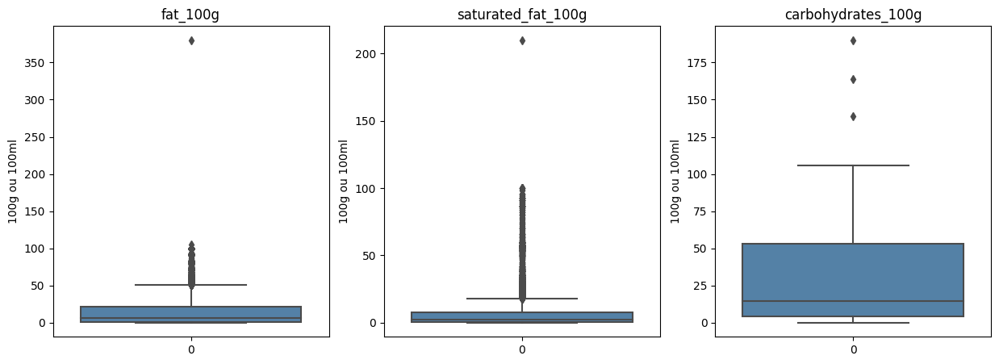

In [61]:

# Visualisation des outliers
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.boxplot(data=df_tra['fat_100g'], color='SteelBlue')
plt.title("fat_100g")
#plt.ylim([-5,100])
plt.ylabel('100g ou 100ml')
plt.xlabel = ''

plt.subplot(1, 3, 2)
sns.boxplot(data=df_tra['saturated_fat_100g'], color='SteelBlue')
plt.title("saturated_fat_100g")
#plt.ylim([-5,100])
plt.ylabel('100g ou 100ml')
plt.xlabel = ''

plt.subplot(1, 3, 3)
sns.boxplot(data=df_tra['carbohydrates_100g'], color='SteelBlue')
plt.title("carbohydrates_100g")
#plt.ylim([-5,100])
plt.ylabel('100g ou 100ml')
plt.xlabel = ''



plt.show()

**Remarque**: 
les variables 'fat_100g', saturated_fat_100g et carbohydrates_100g contiennent  des outliers => à supprimer 

    

In [62]:
#Afficher les produits dont l'acide gras >100g
df = df_tra.loc[df_tra['fat_100g'] > 100]
df.groupby('pnns_groups_1')['product_name'].count()

pnns_groups_1
cereals and potatoes    1
salty snacks            1
Name: product_name, dtype: int64

In [63]:
#Afficher les produits dont graisses_saturées >100g
df = df_tra.loc[df_tra['saturated_fat_100g'] > 100]
df.groupby('pnns_groups_1')['product_name'].count()

pnns_groups_1
salty snacks    1
Name: product_name, dtype: int64

In [64]:
#Afficher les produits dont hydrate de carbonne >100g
df = df_tra.loc[df_tra['carbohydrates_100g'] > 100]
df.groupby('pnns_groups_1')['product_name'].count()

pnns_groups_1
fruits and vegetables    1
salty snacks             1
sugary snacks            2
unknown                  3
Name: product_name, dtype: int64

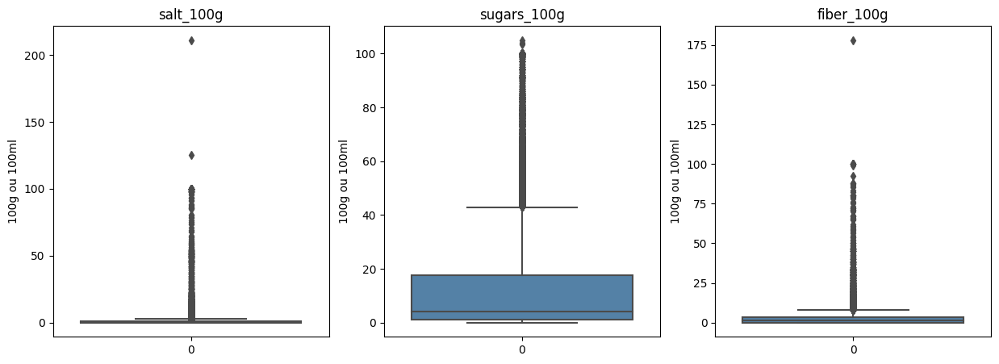

In [65]:

# Visualisation des outliers
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 2)
sns.boxplot(data=df_tra['sugars_100g'], color='SteelBlue')
plt.title("sugars_100g")
#plt.ylim([-5,100])
plt.ylabel('100g ou 100ml')
plt.xlabel = ''

plt.subplot(1, 3, 3)
sns.boxplot(data=df_tra['fiber_100g'], color='SteelBlue')
plt.title("fiber_100g")
#plt.ylim([-5,100])
plt.ylabel('100g ou 100ml')
plt.xlabel = ''

plt.subplot(1, 3, 1)
sns.boxplot(data=df_tra['salt_100g'], color='SteelBlue')
plt.title("salt_100g")
#plt.ylim([-5,100])
plt.ylabel('100g ou 100ml')
plt.xlabel = ''

plt.show()

**Remarque**: 
les variables 'salt_100g', sugars_100g et fiber_100g contiennent  des outliers => à supprimer 

    

In [66]:
#Afficher les produits dont sel >100g
df = df_tra.loc[df_tra['salt_100g'] > 100]
df.groupby('pnns_groups_1')['product_name'].count()

pnns_groups_1
sugary snacks    1
unknown          1
Name: product_name, dtype: int64

In [67]:
#Afficher les produits dont sel >100g
df = df_tra.loc[df_tra['sugars_100g'] > 100]
df.groupby('pnns_groups_1')['product_name'].count()

pnns_groups_1
sugary snacks    1
unknown          2
Name: product_name, dtype: int64

In [68]:
#Afficher les produits dont sel >100g
df = df_tra.loc[df_tra['fiber_100g'] > 100]
df.groupby('pnns_groups_1')['product_name'].count()

pnns_groups_1
unknown    1
Name: product_name, dtype: int64

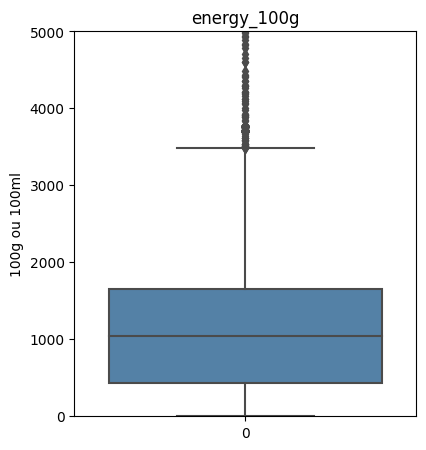

In [69]:

# Visualisation des outliers
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.boxplot(data=df_tra['energy_100g'], color='SteelBlue')
plt.title("energy_100g")
plt.ylim([-5,5000])
plt.ylabel('100g ou 100ml')
plt.xlabel = ''

plt.show()

**Remarque** : Le maximum de calories pour un produit de 100g est 900 kcal. 1 calorie~4,184 Joules ==> 900 kcal ~ 3765 kJoules. La limite d'énergie en kilo Joules à ne pas dépasser est 3766 kJ.

In [70]:
df = df_tra.loc[df_tra['energy_100g']==3766]
df.groupby('pnns_groups_1')['product_name'].count()

pnns_groups_1
fat and sauces    59
nan               71
unknown            4
Name: product_name, dtype: int64


### <span style='colour:#20185e'>4.4. Remplacer les valeurs abbérantes par Nan grace à la méthode IQR </span>



In [71]:
#fonction pour remplacer les valeurs abbérantes par Nan par la methode de l'ecart interquartile

def remplacer_abb_val(dataframe: pd.DataFrame, columns: list[str]) -> pd.DataFrame:
    
    df = dataframe.copy()
    Q = df[columns].quantile([0.25, 0.75])
    iqr = Q.loc[0.75]-Q.loc[0.25]
    limits = pd.DataFrame({
        col: [
            Q.loc[0.25, col] - 1.5 * iqr[col], # min
            Q.loc[0.75, col] + 1.5 * iqr[col], # max
        ] for col in columns
    }, index=['min', 'max'])
    #Remplir par des Nans si en dehors de l'intervalle 
    for col in columns:
        df.loc[:,col] = dataframe[col].where(
            limits.loc['min', col] <= dataframe[col]
        ).where(
            dataframe[col] <= limits.loc['max', col]
        )

    return df

In [72]:
#Nettoyer les outliers des différents variables
df_nettoyer_abb = df_tra.copy()
df_nettoyer_abb = remplacer_abb_val(df_nettoyer_abb, cols_nutriments)
df_nettoyer_abb.describe().T

,count,mean,std,min,25%,50%,75%,max
energy_100g,63766.0,1095.172451,747.495024,0.0,423.000,1028.0000,1636.0,3477.00
fat_100g,45627.0,11.085170,11.977175,0.0,1.200,6.1000,19.0,50.50
saturated_fat_100g,57570.0,3.715716,4.773169,0.0,0.207,1.5850,5.4,18.00
carbohydrates_100g,46889.0,27.723941,27.393981,0.0,4.000,14.5000,53.0,106.00
sugars_100g,55803.0,8.103918,10.444417,0.0,0.900,3.2000,11.3,42.90
fiber_100g,42610.0,1.737282,1.967372,0.0,0.000,1.1000,2.8,8.00
proteins_100g,61437.0,6.802438,6.064779,0.0,1.600,5.7000,9.7,24.71
salt_100g,58880.0,0.664023,0.683576,0.0,0.060,0.4826,1.1,2.99
nutrition_score_fr_100g,61106.0,8.679802,9.043660,-15.0,1.000,9.0000,15.0,36.00
additives_n,51180.0,1.495545,1.864874,0.0,0.000,1.0000,2.0,7.00


**Remarque**: Nous voyons que cette methode interquartile n'est pas adaptée dans cette situation. Par conséquent, nous allons plutot supprimer les valeurs dont les variables sont supérieurs à 100g. Pour la variable energie_100g avec une limite à ne pas depasser 3766kJ

### <span style='colour:#20185e'>4.5. Remplacer les valeurs abbérantes par Nan </span>

In [73]:
#énergie pour 100g <= 3766 kJ
df_tra['energy_100g'] = [np.nan if val >
                           3766 else val for val in df_tra['energy_100g']]

In [74]:
#Liste des variables _100g 
cols_var100g = cols_nutriments.copy()
cols_var100g.remove('energy_100g')
cols_var100g.remove('nutrition_score_fr_100g')
cols_var100g.remove('additives_n')
cols_var100g.remove('ingredients_from_palm_oil')


In [75]:
#valeurs des variables en '_100g' >=0 et <=100
for col in cols_var100g:
    df_tra[col] = [np.nan if val > 100 else np.nan if val <
                     0 else val for val in df_tra[col]]


**La masse totale des glucides doit etre inférieure a la masse de sucre**

In [76]:
df_tra = df_tra.drop(
    df_tra[df_tra['carbohydrates_100g'] < df_tra['sugars_100g']].index)

**La masse totale des lipides doit etre inférieure a la masse des acides gras**

In [77]:
df_tra['saturated_fat_100g'] = [np.nan
                                if row[0] < row[1] else row[1] for row in zip(df_tra['fat_100g'], df_tra['saturated_fat_100g'])]

**Suppréssions de la variable countries plus utile dans la suite**

In [78]:
df_tra.drop(columns = ['countries'],inplace = True)

In [79]:
#Verification 
df_tra.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
code,91166,91166,0000000003087,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,91166,74296,Huile d'olive vierge extra,62,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_1,91166,11,nan,27659,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_2,91166,38,nan,25584,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,61413,26469,"Snacks sucrés,Biscuits et gâteaux,Biscuits",291,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives,53335,45455,[ semoule-de-ble-dur-de-qualite-superieure ->...,197,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_fr,61009,5,d,16888,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brands,85324,20874,Carrefour,2818,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,64055.0,NaN,NaN,NaN,1111.313014,772.562039,0.0,427.0,1033.0,1647.0,3766.0
fat_100g,47226.0,NaN,NaN,NaN,13.330781,16.856177,0.0,1.3,6.8,21.0,100.0


### <span style='colour:#20185e'>4.6. Recherche de Correlation </span>

In [80]:
df_tra[cols_nutriments].corr(method='spearman')

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g,additives_n,ingredients_from_palm_oil
energy_100g,1.000000,0.752955,0.659036,0.487589,0.253492,0.290598,0.376982,0.133568,0.620998,0.081275,0.270166
fat_100g,0.752955,1.000000,0.920861,-0.033748,-0.044827,0.211253,0.446383,0.394782,0.623782,0.098942,0.224058
saturated_fat_100g,0.659036,0.920861,1.000000,-0.028252,0.005383,0.033670,0.436614,0.334478,0.663748,0.138421,0.260721
carbohydrates_100g,0.487589,-0.033748,-0.028252,1.000000,0.665068,0.481565,-0.056122,-0.246638,0.157924,0.151582,0.284216
sugars_100g,0.253492,-0.044827,0.005383,0.665068,1.000000,0.154284,-0.284028,-0.339502,0.338386,0.217776,0.228897
fiber_100g,0.290598,0.211253,0.033670,0.481565,0.154284,1.000000,0.236481,0.010438,-0.228658,-0.063303,0.107477
proteins_100g,0.376982,0.446383,0.436614,-0.056122,-0.284028,0.236481,1.000000,0.482579,0.101685,-0.057346,0.005085
salt_100g,0.133568,0.394782,0.334478,-0.246638,-0.339502,0.010438,0.482579,1.000000,0.284789,0.176067,0.082657
nutrition_score_fr_100g,0.620998,0.623782,0.663748,0.157924,0.338386,-0.228658,0.101685,0.284789,1.000000,0.279620,0.257054
additives_n,0.081275,0.098942,0.138421,0.151582,0.217776,-0.063303,-0.057346,0.176067,0.279620,1.000000,0.421256


In [81]:
df_tra[cols_nutriments].corr(method='spearman').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'))

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g,additives_n,ingredients_from_palm_oil
energy_100g,1.0,0.75,0.66,0.49,0.25,0.29,0.38,0.13,0.62,0.081,0.27
fat_100g,0.75,1.0,0.92,-0.034,-0.045,0.21,0.45,0.39,0.62,0.099,0.22
saturated_fat_100g,0.66,0.92,1.0,-0.028,0.0054,0.034,0.44,0.33,0.66,0.14,0.26
carbohydrates_100g,0.49,-0.034,-0.028,1.0,0.67,0.48,-0.056,-0.25,0.16,0.15,0.28
sugars_100g,0.25,-0.045,0.0054,0.67,1.0,0.15,-0.28,-0.34,0.34,0.22,0.23
fiber_100g,0.29,0.21,0.034,0.48,0.15,1.0,0.24,0.01,-0.23,-0.063,0.11
proteins_100g,0.38,0.45,0.44,-0.056,-0.28,0.24,1.0,0.48,0.1,-0.057,0.0051
salt_100g,0.13,0.39,0.33,-0.25,-0.34,0.01,0.48,1.0,0.28,0.18,0.083
nutrition_score_fr_100g,0.62,0.62,0.66,0.16,0.34,-0.23,0.1,0.28,1.0,0.28,0.26
additives_n,0.081,0.099,0.14,0.15,0.22,-0.063,-0.057,0.18,0.28,1.0,0.42


**Remarque**: 
- Corrélation entre : **nutrition_score_fr_100g**, **energy_100g**, **fat_100g** et **saturated_fat_100g**
- Forte Corrélation entre : **saturated_fat_100g** et **fat_100g**
- Forte Corrélation entre : **sugars_100g** et **Carbohydrates_100g**
- Corrélation entre : **proteins_100g** et **salt_100g**
- Forte Corrélation entre : **fat_100g** et **energy_100g**
***
Le fibre **'fiber_100g'** est moins corrélé aux autres variables 

## <span style='background:pink'>5. Imputation des valeurs manquantes </span>

### <span style='colour:#20185e'>5.1. IMputation par mise à '0' pour certaines variables </span>



**Listes des additifs 'additives'**
- Liste des additifs On ne peut pas inventer la liste des additifs d'un produit, ni le trouver simplement. Le choix est fait de ne pas effectuer d'imputation. On va mettre '0' a la place 


In [82]:
df_tra['additives'] = df_tra['additives'].fillna(0)

**Nombre d'additifs** 'additives_n'

- on remplace par '0' si le nombre d'additifs n'est pas renseigné 
    

In [83]:
df_tra['additives_n'] = df_tra['additives_n'].fillna(0)

**L'huile de palme**

-  on va remplacer par '0' ceux qui n'ont pas été renseignés  

In [84]:
#Remplacer par '0' les valeurs non-reseignés
df_tra['ingredients_from_palm_oil'] = df_tra['ingredients_from_palm_oil'].fillna(0)
df_tra.describe(include ='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
code,91166,91166,0000000003087,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,91166,74296,Huile d'olive vierge extra,62,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_1,91166,11,nan,27659,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_2,91166,38,nan,25584,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,61413,26469,"Snacks sucrés,Biscuits et gâteaux,Biscuits",291,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives,91166.0,45456.0,0.0,37831.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_fr,61009,5,d,16888,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brands,85324,20874,Carrefour,2818,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,64055.0,NaN,NaN,NaN,1111.313014,772.562039,0.0,427.0,1033.0,1647.0,3766.0
fat_100g,47226.0,NaN,NaN,NaN,13.330781,16.856177,0.0,1.3,6.8,21.0,100.0


### <span style='colour:#20185e'>5.2. IMputation par la moyenne pour 'fiber_100g' </span>



**Fibre** 'fiber_100g'

- Etant donné que les fibres sont moins corrélés avec les autres nutriments, on va remplacer les valeurs manquantes par la moyenne

In [85]:
df_tra['fiber_100g'] = df_tra['fiber_100g'].fillna(df_tra['fiber_100g'].mean())

In [86]:
df_tra.replace('nan',np.nan,inplace = True)
df_tra.describe(include= 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
code,91166,91166,0000000003087,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,91166,74296,Huile d'olive vierge extra,62,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_1,63507,10,unknown,11421,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_2,65582,37,unknown,11421,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,61413,26469,"Snacks sucrés,Biscuits et gâteaux,Biscuits",291,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives,91166.0,45456.0,0.0,37831.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_fr,61009,5,d,16888,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brands,85324,20874,Carrefour,2818,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,64055.0,NaN,NaN,NaN,1111.313014,772.562039,0.0,427.0,1033.0,1647.0,3766.0
fat_100g,47226.0,NaN,NaN,NaN,13.330781,16.856177,0.0,1.3,6.8,21.0,100.0


In [87]:
#Les varibales de travail
cols_tra = df_tra.select_dtypes(include = [np.number]).columns.to_list()
#Enlever 'fiber_100g' , 'additives_n' et 'ingredients_from_palm_oil' (deja remplis) et nutrition_score_fr_100g
cols_tra.remove('fiber_100g')
cols_tra.remove('additives_n')
cols_tra.remove('ingredients_from_palm_oil')
cols_tra.remove('nutrition_score_fr_100g')
cols_tra

['energy_100g',
 'fat_100g',
 'saturated_fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'proteins_100g',
 'salt_100g']

In [88]:
#Dataframe de travail
df_food = df_tra.copy()

In [89]:
def plot_val_manq(dataframe: pd.DataFrame) -> None:
    num_rows = len(dataframe.index)
    columns_emptiness = pd.DataFrame({
        col : { 
            'count': dataframe[col].isna().sum(),
            'percent': 100 * dataframe[col].isna().sum() / num_rows,
        } for col in dataframe.columns
    }).transpose().sort_values(by=['count'])

    fig = px.bar(columns_emptiness,
        color='percent',
        y='percent',
        labels={
            'index':'Variables',
            'percent':'% de valeurs manquantes',
            'count':'# valeurs manquantes',
        },
        hover_data=['count'],
        title='Valeurs manquantes par colonne',
        width=1200,
        height=600,
    )
    fig.show()
plot_val_manq(df_food)

Nous voyons que un grand nombre de variables _100g ont un taux de complétude très faible . Nous allons effectuer une imputation des variables

### <span style='colour:#20185e'>5.2. IMputation par KNeighborsRegressor pour les varibales _100g </span>

In [90]:
def traitementNAN(df,colonne_target,colonnes_data):
    a_traiter = df[colonne_target].isna().sum()/len(df)*100
    print(f'La colonne {colonne_target} a {a_traiter:.2f} % de valeur manquantes à traiter')
    
    colonnes_total = colonnes_data
    colonnes_total.append(colonne_target)
    dataSampindex = df[df[colonne_target].notna()].sample(10000).index
    dataSamp = df.loc[dataSampindex,colonnes_total]
    dataSamp = dataSamp.dropna()

    data = dataSamp[colonnes_data]
    target = dataSamp[colonne_target]
    xtrain, xtest, ytrain, ytest = train_test_split(data, target, train_size=0.8)
    
    knn = neighbors.KNeighborsRegressor(n_neighbors=5)
    knn.fit(xtrain, ytrain)
    #calcule de précision
    print('\tscore R^2 : ',knn.score(xtest, ytest))

    return knn.predict(df[colonnes_data].fillna(value=0))

In [91]:
colonne_a_completer = cols_tra.copy()
df_knn = df_food.copy()

In [92]:
dico_colonne={}
dico_error={}
for i in range(0,len(colonne_a_completer)):
    colonne_travail=colonne_a_completer.copy()
    index = colonne_travail.pop(i)
    dico_colonne[index]=colonne_travail
    
for target, data in dico_colonne.items():
    target_pred = target+'_pred'
    df_knn[target_pred] = traitementNAN(df_knn,target,data) 

La colonne energy_100g a 29.74 % de valeur manquantes à traiter
	score R^2 :  0.9999764885344167
La colonne fat_100g a 48.20 % de valeur manquantes à traiter
	score R^2 :  0.9868682516274837
La colonne saturated_fat_100g a 32.12 % de valeur manquantes à traiter
	score R^2 :  0.8325393636656798
La colonne carbohydrates_100g a 48.68 % de valeur manquantes à traiter
	score R^2 :  0.9891334723179643
La colonne sugars_100g a 31.89 % de valeur manquantes à traiter
	score R^2 :  0.9806044135570058
La colonne proteins_100g a 29.92 % de valeur manquantes à traiter
	score R^2 :  0.8338112973545134
La colonne salt_100g a 31.83 % de valeur manquantes à traiter
	score R^2 :  0.5040366146354589


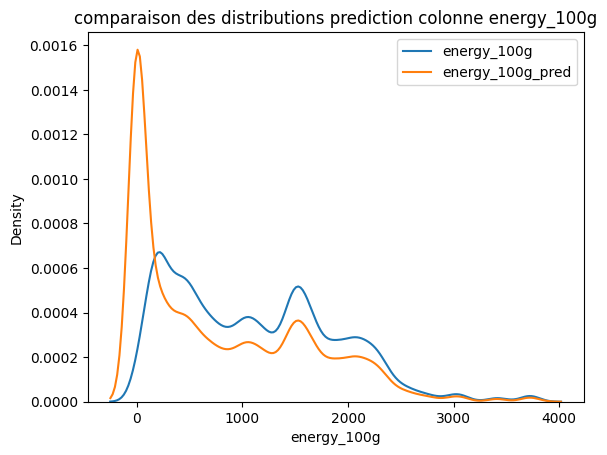

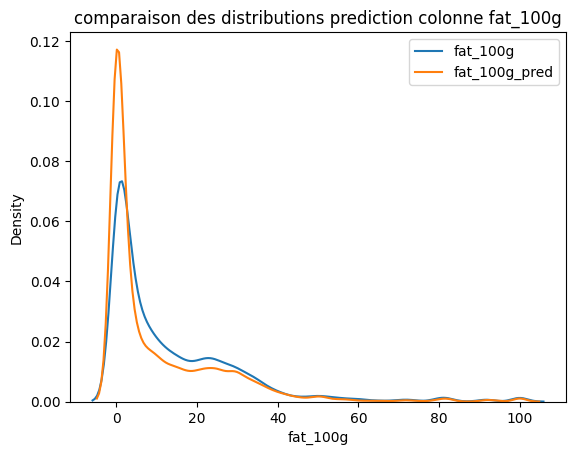

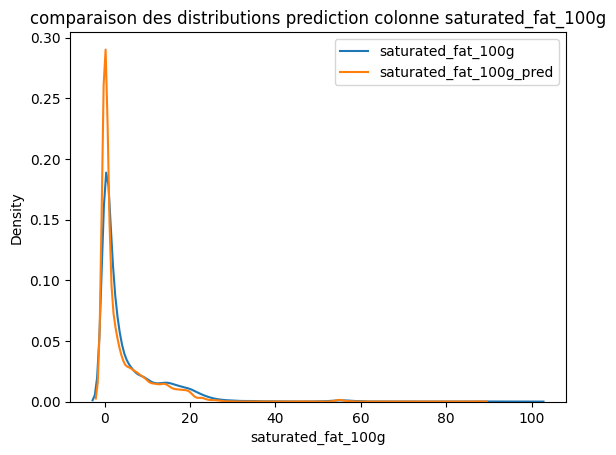

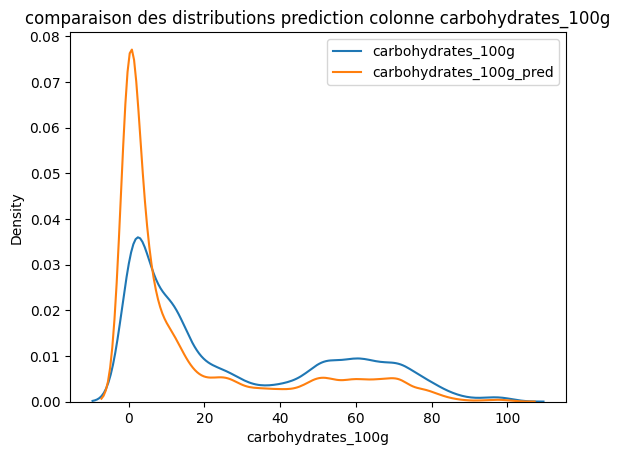

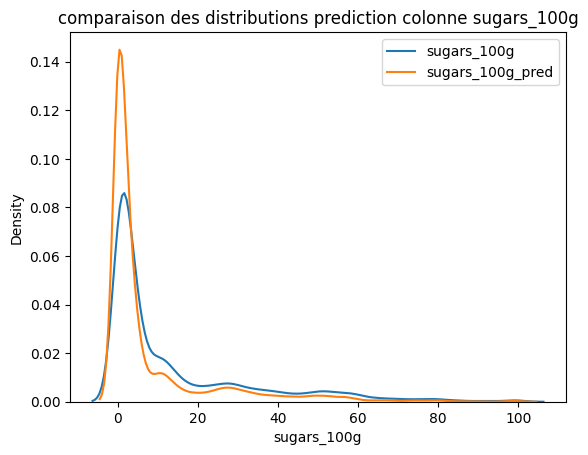

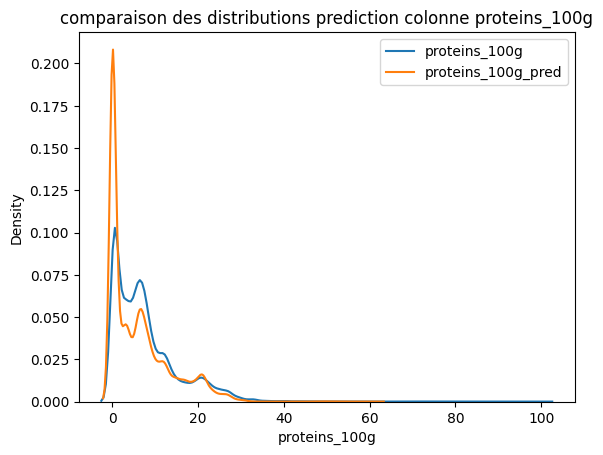

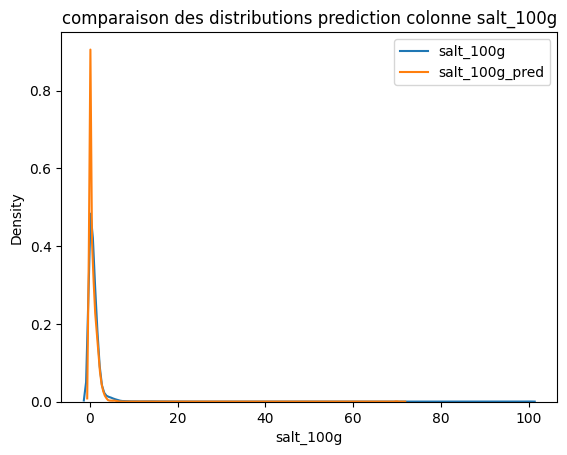

In [93]:
for target, data in dico_colonne.items():
    target_pred = target+'_pred'
    sns.kdeplot(x = target, data = df_knn, label=target)
    sns.kdeplot(data = df_knn, x = target_pred, label=target_pred)
    plt.title(f'comparaison des distributions prediction colonne {target}')
    plt.legend()
    fichier = 'predictg_'+target+'.png'
    plt.savefig(fichier)
    plt.show()

In [94]:
for target, data in dico_colonne.items():
    target_pred = target+'_pred'
    df_knn[target].fillna(df_knn[target_pred], inplace=True)
    df_knn.drop(columns=[target_pred],inplace = True)

In [95]:
df_knn.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
code,91166,91166,0000000003087,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,91166,74296,Huile d'olive vierge extra,62,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_1,63507,10,unknown,11421,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_2,65582,37,unknown,11421,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,61413,26469,"Snacks sucrés,Biscuits et gâteaux,Biscuits",291,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives,91166.0,45456.0,0.0,37831.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_fr,61009,5,d,16888,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brands,85324,20874,Carrefour,2818,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,91166.0,NaN,NaN,NaN,780.845177,823.035994,0.0,0.0,490.0,1458.0,3766.0
fat_100g,91166.0,NaN,NaN,NaN,10.51491,15.949077,0.0,0.0,2.58,17.0,100.0


<Axes: >

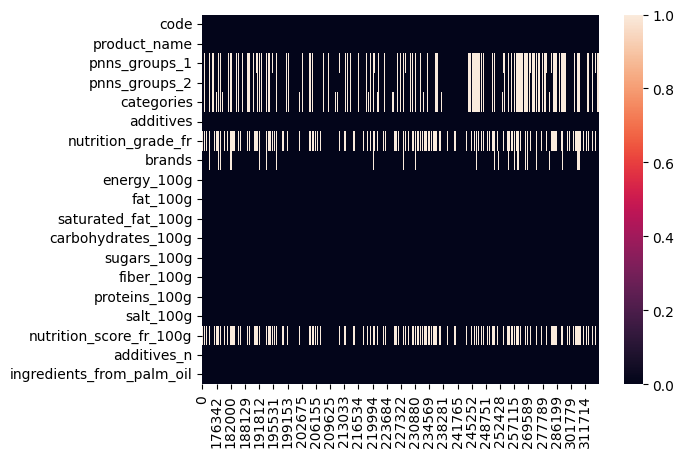

In [96]:
sns.heatmap(df_knn.isna().T)

### <span style='colour:#20185e'>5.3. Verification des outliers et Imputation pour 'nutrition_grade_fr' et le 'nutrition_score_fr_100g'</span>

In [97]:
colonne_a_completer = cols_tra.copy()
df_mode = df_knn.copy()

In [98]:
df_mode.replace('NaN', np.nan,inplace=True)
df_mode.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
code,91166,91166,0000000003087,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,91166,74296,Huile d'olive vierge extra,62,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_1,63507,10,unknown,11421,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_2,65582,37,unknown,11421,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,61413,26469,"Snacks sucrés,Biscuits et gâteaux,Biscuits",291,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives,91166.0,45456.0,0.0,37831.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_fr,61009,5,d,16888,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brands,85324,20874,Carrefour,2818,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,91166.0,NaN,NaN,NaN,780.845177,823.035994,0.0,0.0,490.0,1458.0,3766.0
fat_100g,91166.0,NaN,NaN,NaN,10.51491,15.949077,0.0,0.0,2.58,17.0,100.0


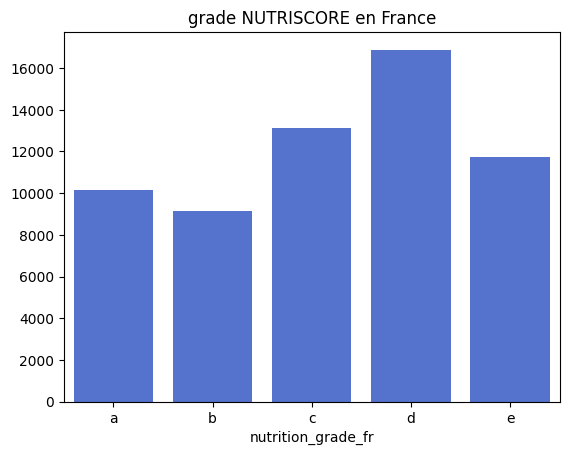

In [99]:
df = df_mode['nutrition_grade_fr'].value_counts().sort_index()
sns.barplot(x=df.index, y= df.values, color='royalblue')
plt.title('grade NUTRISCORE en France')
plt.savefig('nutriscore_grade_fr.jpg', bbox_inches='tight')
plt.show()

In [100]:
quali = ['categories', 'pnns_groups_1', 'pnns_groups_2','brands']
df_snan = df_mode.dropna(subset = quali ,how = 'any')
df_snan.describe(include = 'all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
code,58800,58800,0000005200016,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,58800,47451,Huile d'olive vierge extra,54,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_1,58800,10,sugary snacks,9748,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_2,58800,35,unknown,7111,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,58800,25002,"Snacks sucrés,Biscuits et gâteaux,Biscuits",291,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives,58800.0,42958.0,0.0,8617.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_fr,44138,5,d,12198,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brands,58800,13082,Carrefour,2202,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,58800.0,NaN,NaN,NaN,872.373009,817.325519,0.0,136.0,644.0,1510.0,3766.0
fat_100g,58800.0,NaN,NaN,NaN,10.925888,16.240458,0.0,0.0,3.3,17.0,100.0


In [101]:
df_snan['TOUT']=df_snan[cols_tra].sum(axis=1)
df_snan.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
code,58800,58800,0000005200016,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,58800,47451,Huile d'olive vierge extra,54,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_1,58800,10,sugary snacks,9748,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_2,58800,35,unknown,7111,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,58800,25002,"Snacks sucrés,Biscuits et gâteaux,Biscuits",291,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives,58800.0,42958.0,0.0,8617.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_fr,44138,5,d,12198,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brands,58800,13082,Carrefour,2202,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,58800.0,NaN,NaN,NaN,872.373009,817.325519,0.0,136.0,644.0,1510.0,3766.0
fat_100g,58800.0,NaN,NaN,NaN,10.925888,16.240458,0.0,0.0,3.3,17.0,100.0


In [102]:
df_snan = df_snan.loc[df_snan['TOUT'] > 0]
df_snan.drop(columns = ['TOUT'], inplace = True)
df_snan.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
code,47628,47628,0000040608754,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,47628,39230,Huile d'olive vierge extra,43,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_1,47628,10,sugary snacks,8090,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_2,47628,35,unknown,4881,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,47628,20888,"Snacks sucrés,Biscuits et gâteaux,Biscuits",264,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives,47628.0,37007.0,0.0,4985.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_fr,44013,5,d,12198,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brands,47628,9732,Carrefour,1943,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,47628.0,NaN,NaN,NaN,1077.003715,777.38531,0.0,390.0,990.0,1625.0,3766.0
fat_100g,47628.0,NaN,NaN,NaN,13.488751,17.060219,0.0,1.3,6.9,21.5,100.0


**Verification des outliers**

<Figure size 1800x1400 with 0 Axes>

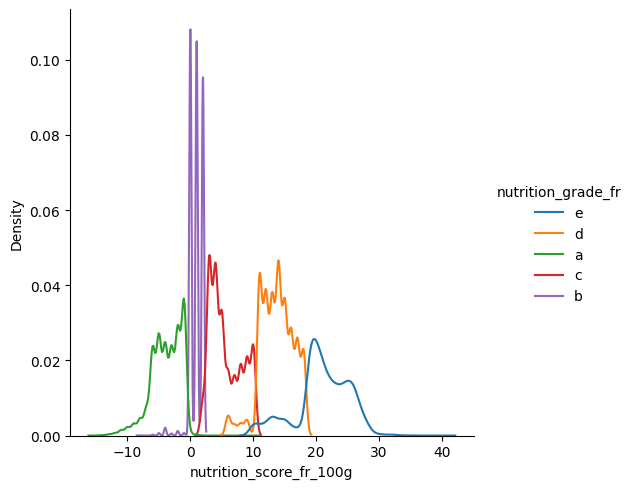

In [103]:
# afficher les distributions KDE des groupes nutriscore_grade
plt.figure(figsize=(18,14))
plt.savefig('chauvechement nutri')
sns.displot(data=df_snan, x="nutrition_score_fr_100g", hue="nutrition_grade_fr", kind='kde')

In [104]:
# Voir les valeurs extremes pour les nutriscores_scores (les groupes ne sont pas bien définis)
df_snan.groupby('nutrition_grade_fr')[['nutrition_score_fr_100g']].agg([min,max,np.mean, len])

nutrition_score_fr_100g                        
                                       min   max       mean    len
nutrition_grade_fr                                                
a                                    -15.0  10.0  -3.820496   7699
b                                     -8.0   2.0   0.882545   6130
c                                      2.0  10.0   5.605466   9586
d                                      6.0  18.0  13.692081  12198
e                                     10.0  40.0  20.951190   8400

**Nous allons corriger les chauvechements entre les différents groupes en supprimant les outliers**

In [105]:
# Supprimer les outliers pour le groupe A nutriscore_score
group_nutriscore_grade = df_snan.groupby('nutrition_grade_fr')
groups_a= group_nutriscore_grade.get_group('a')
groups_a_no_outliers = groups_a[~groups_a['nutrition_score_fr_100g'].isin([0.0, 1.0, 2.0, 4.0, 6.0, 10.0])]
groups_a_no_outliers.shape

(7660, 19)

In [106]:
# Supprimer les outliers pour le groupe B nutriscore_score
group_nutriscore_grade = df_snan.groupby('nutrition_grade_fr')
groups_b= group_nutriscore_grade.get_group('b')
groups_b_no_outliers = groups_b[~groups_b['nutrition_score_fr_100g'].isin([-8.0, -7.0, -6.0, -5.0,-4.0, -3.0,-2.0, -1.0])]
groups_b_no_outliers.shape

(6022, 19)

In [107]:
# Supprimer les outliers pour le groupe C nutriscore_score
group_nutriscore_grade = df_snan.groupby('nutrition_grade_fr')
groups_c= group_nutriscore_grade.get_group('c')
groups_c_no_outliers = groups_c[~groups_c['nutrition_score_fr_100g'].isin([2])]
groups_c_no_outliers.shape

(9208, 19)

In [108]:
# Supprimer les outliers pour le groupe C nutriscore_score
group_nutriscore_grade = df_snan.groupby('nutrition_grade_fr')
groups_d= group_nutriscore_grade.get_group('d')
groups_d_no_outliers = groups_d[~groups_d['nutrition_score_fr_100g'].isin([6.0,7.0,8.0,9.0,10.0])]
groups_d_no_outliers.shape

(11532, 19)

In [109]:
# Supprimer les outliers pour le groupe C nutriscore_score
group_nutriscore_grade = df_snan.groupby('nutrition_grade_fr')
groups_e= group_nutriscore_grade.get_group('e')
groups_e_no_outliers = groups_e[~groups_e['nutrition_score_fr_100g'].isin([9.0,10.0,11.0,12.0,13.0,14.0, 15.0, 16.0, 17.0,18.0])]
groups_e_no_outliers.shape

(7047, 19)

In [110]:
# Concatener les dataframes avec les outliers supprimés pour chaque groupe
df_snan = pd.concat([groups_a_no_outliers, groups_b_no_outliers, groups_c_no_outliers, groups_d_no_outliers, groups_e_no_outliers ], axis=0)
print(df_snan.shape)
df_snan.head(3)

(41469, 19)


,code,product_name,pnns_groups_1,pnns_groups_2,categories,additives,nutrition_grade_fr,brands,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g,additives_n,ingredients_from_palm_oil
463,00013628,Chicken pad thaï,composite foods,one dish meals,Plats à base de poulet,0,a,MARKS & SPENCER,619.0,11.36,0.7,2.24,2.9,1.1,8.4,0.75,-2.0,0.0,0.0
680,00073455,"grilled Cajun chicken breast, spicy wedges & s...",composite foods,one dish meals,"Plats préparés,Plats à base de viande,Plats à ...",[ pommes-de-terre -> fr:pommes-de-terre ] [...,a,"Marks & Spencer,M&S,Count on US",354.0,1.60,0.6,7.80,2.7,1.3,8.9,0.25,-4.0,3.0,0.0
894,00090100,Pulled Pork & Chorizo Feijoada,composite foods,one dish meals,"Plats préparés,Feijoada,Plats préparés à récha...",[ riz-basmati-cuit -> fr:riz-basmati-cuit ] ...,a,"Marks & Spencer,M&S",622.0,4.40,2.0,16.00,0.5,2.2,10.0,0.63,-4.0,5.0,0.0


<Figure size 1800x1400 with 0 Axes>

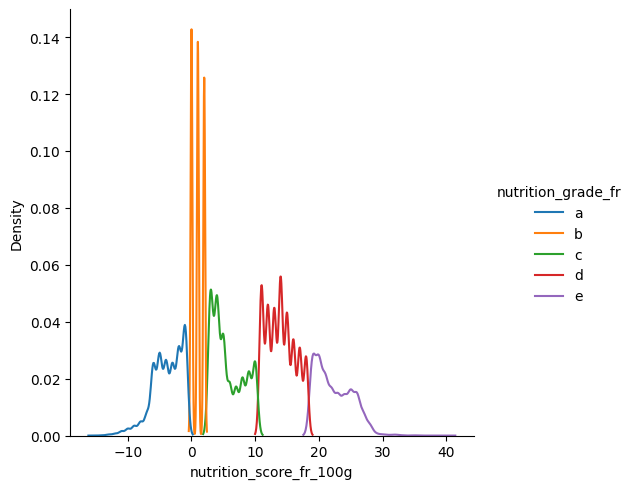

In [111]:
# afficher les distributions KDE des groupes nutriscore_grade
plt.figure(figsize=(18,14))
sns.displot(data=df_snan, x="nutrition_score_fr_100g", hue="nutrition_grade_fr", kind='kde')

**Remarque** : Il n'existe plus de chauvechements entre les différents groupes selon leur nutri-score

In [112]:
df_snan.groupby('nutrition_grade_fr')[['nutrition_score_fr_100g']].agg([min,max,np.mean, len])

nutrition_score_fr_100g                        
                                       min   max       mean    len
nutrition_grade_fr                                                
a                                    -15.0  -1.0  -3.843734   7660
b                                      0.0   2.0   0.958319   6022
c                                      3.0  10.0   5.753475   9208
d                                     11.0  18.0  14.055498  11532
e                                     19.0  40.0  22.387399   7047

In [113]:
df_snan.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
code,41469,41469,00013628,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,41469,34410,Huile d'olive vierge extra,38,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_1,41469,10,sugary snacks,7718,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_2,41469,35,unknown,4315,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,41469,18509,"Snacks sucrés,Biscuits et gâteaux,Biscuits",259,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives,41469.0,32589.0,0.0,4153.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_fr,41469,5,d,11532,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brands,41469,8271,Carrefour,1742,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,41469.0,NaN,NaN,NaN,1153.512811,758.962385,0.0,481.0,1074.0,1678.0,3766.0
fat_100g,41469.0,NaN,NaN,NaN,14.356853,17.108305,0.0,1.9,8.0,22.7,100.0


In [114]:
df_snan[['nutrition_grade_fr']].value_counts()

nutrition_grade_fr
d                     11532
c                      9208
a                      7660
e                      7047
b                      6022
Name: count, dtype: int64

<Axes: >

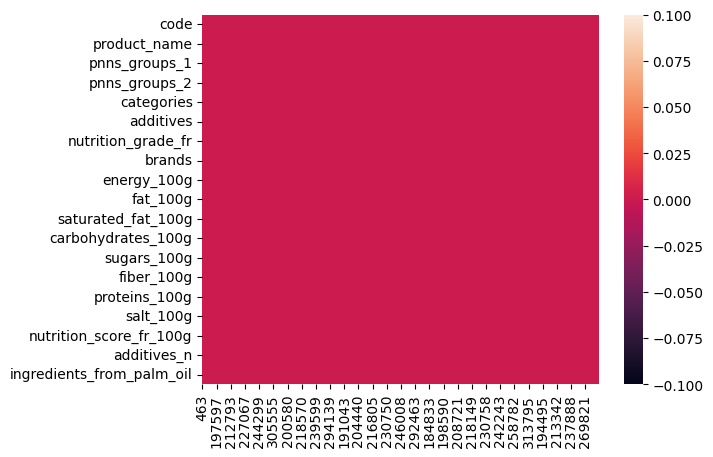

In [115]:
sns.heatmap(df_snan.isna().T)

## <span style='background:pink'>6. Analyse exploratoire des données  </span>

In [116]:
df_food_final = df_snan.copy()

In [117]:
df_food_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41469 entries, 463 to 320611
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   code                       41469 non-null  object 
 1   product_name               41469 non-null  object 
 2   pnns_groups_1              41469 non-null  object 
 3   pnns_groups_2              41469 non-null  object 
 4   categories                 41469 non-null  object 
 5   additives                  41469 non-null  object 
 6   nutrition_grade_fr         41469 non-null  object 
 7   brands                     41469 non-null  object 
 8   energy_100g                41469 non-null  float64
 9   fat_100g                   41469 non-null  float64
 10  saturated_fat_100g         41469 non-null  float64
 11  carbohydrates_100g         41469 non-null  float64
 12  sugars_100g                41469 non-null  float64
 13  fiber_100g                 41469 non-null  float

In [118]:
#Supprimer les doublons
df_food_final.drop_duplicates(inplace = True)
df_food_final.shape

(41469, 19)

In [119]:
#Transformer float64 en float32 moins d'allocation de mémoire pour l'analyse exploratoire
cols_float64 = df_food_final.dtypes[df_food_final.dtypes ==
                                    'float64'].index.tolist()
df_food_final[cols_float64] = df_food_final[cols_float64].astype('float32')

In [120]:
# Transformer object en category si nombre modalités < nombre données de la variable
for col in df_food_final.columns.values:
        if df_food_final[col].dtype == 'object':
            # print(dataframe[col].unique())
            print('Colonne : ', col)
            if len(df_food_final[col].unique()) / len(df_food_final[col]) < 0.5:
                df_food_final[col] = df_food_final[col].astype('category')

Colonne :  code
Colonne :  product_name
Colonne :  pnns_groups_1
Colonne :  pnns_groups_2
Colonne :  categories
Colonne :  additives
Colonne :  nutrition_grade_fr
Colonne :  brands


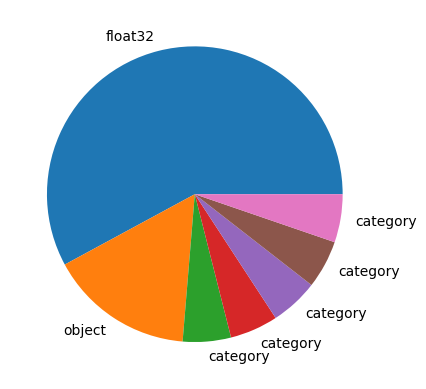

In [121]:
#Verification des types de variables
df_food_final.dtypes.value_counts().plot.pie()
plt.ylabel('')
plt.show()

In [122]:
#Descriptions des variables
df_food_final.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
code,41469,41469,00013628,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,41469,34410,Huile d'olive vierge extra,38,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_1,41469,10,sugary snacks,7718,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pnns_groups_2,41469,35,unknown,4315,NaN,NaN,NaN,NaN,NaN,NaN,NaN
categories,41469,18509,"Snacks sucrés,Biscuits et gâteaux,Biscuits",259,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additives,41469.0,32589.0,0.0,4153.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nutrition_grade_fr,41469,5,d,11532,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brands,41469,8271,Carrefour,1742,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_100g,41469.0,NaN,NaN,NaN,1153.512695,758.962402,0.0,481.0,1074.0,1678.0,3766.0
fat_100g,41469.0,NaN,NaN,NaN,14.356853,17.108305,0.0,1.9,8.0,22.700001,100.0



### <span style='colour:#20185e'>6.1. Analyse univariée</span>


In [123]:
# Variables numériques
cols_num = df_food_final.select_dtypes(include=[np.number]).columns.to_list()
# Variables quantitatives discrètes
cols_quant_discr = ['additives_n', 'ingredients_from_palm_oil',
                    'nutrition_score_fr_100g']
# Variables quantitatives continue
cols_quant_cont = df_food_final.select_dtypes(include=[np.number]).columns.to_list()
for col in cols_quant_discr:
    cols_quant_cont.remove(col)
# Variables qualitatives nominales
cols_qual_nom = df_food_final.select_dtypes(exclude=[np.number]).columns.to_list()
cols_qual_nom.remove('code')
cols_qual_nom.remove('nutrition_grade_fr')
# Variables qualitatives ordinales
cols_qual_ord = ['nutrition_grade_fr']

In [124]:
# Palette des couleurs du nutri-grade
palette_nutri = {'A': '#038141', 'B': '#85bb2f',
                 'C': '#fecb02', 'D': '#ee8100', 'E': '#e63e11'}
# Couleurs du nutri-grade
colors_nutri = ['#038141', '#85bb2f', '#fecb02', '#ee8100', '#e63e11']
colors_nutri_nosort = ['#ee8100', '#85bb2f', '#038141', '#fecb02', '#e63e11']

In [125]:
def plot_univ(df,colonne,label, ylim):
    print(f'analyse univariée colonne {colonne}')
    print(f'moyenne : {df_food_final[colonne].mean()}')
    print(f'médiane : {df_food_final[colonne].median()}')
    print(f'ecart type : {df_food_final[colonne].std()}')
    print(f'min : {df_food_final[colonne].min()}')
    print(f'25% : {df_food_final[colonne].quantile(0.25)}')
    print(f'50% : {df_food_final[colonne].quantile(0.5)}')
    print(f'75% : {df_food_final[colonne].quantile(0.75)}')
    print(f'max : {df_food_final[colonne].max()}')

    sns.boxplot(x=colonne, data = df_food_final)
    plt.title('Boite a moustache '+label+' pour 100g')
    file = label+'_boxplot.jpg'
    plt.savefig(file, bbox_inches='tight')
    plt.show()    

    
    plt.figure(figsize=(12, 8))

    sns.histplot(df_food_final[colonne], kde=True,
             color='SteelBlue', label='repartition '+label+' pour 100g')
    plt.title('repartition '+label+' pour 100g')
    plt.xlim(-15, 40)
    file = label+'_histo.jpg'
    plt.savefig(file, bbox_inches='tight')    
    plt.legend()
    plt.show()




#### <span style='colour:#20185e'>6.1.1. Variables qualitatives discretes</span>


**Nutri-Score**

analyse univariée colonne nutrition_score_fr_100g
moyenne : 8.419734954833984
médiane : 8.0
ecart type : 9.195504188537598
min : -15.0
25% : 1.0
50% : 8.0
75% : 15.0
max : 40.0


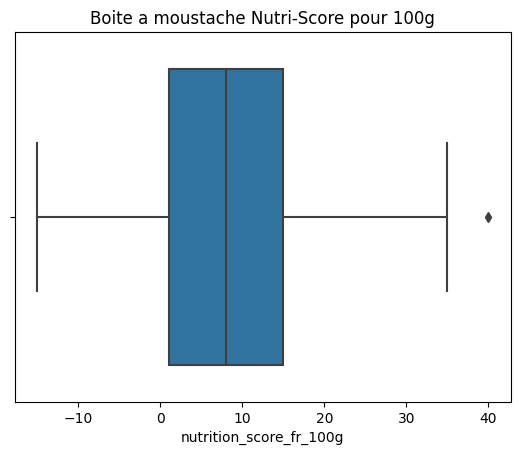

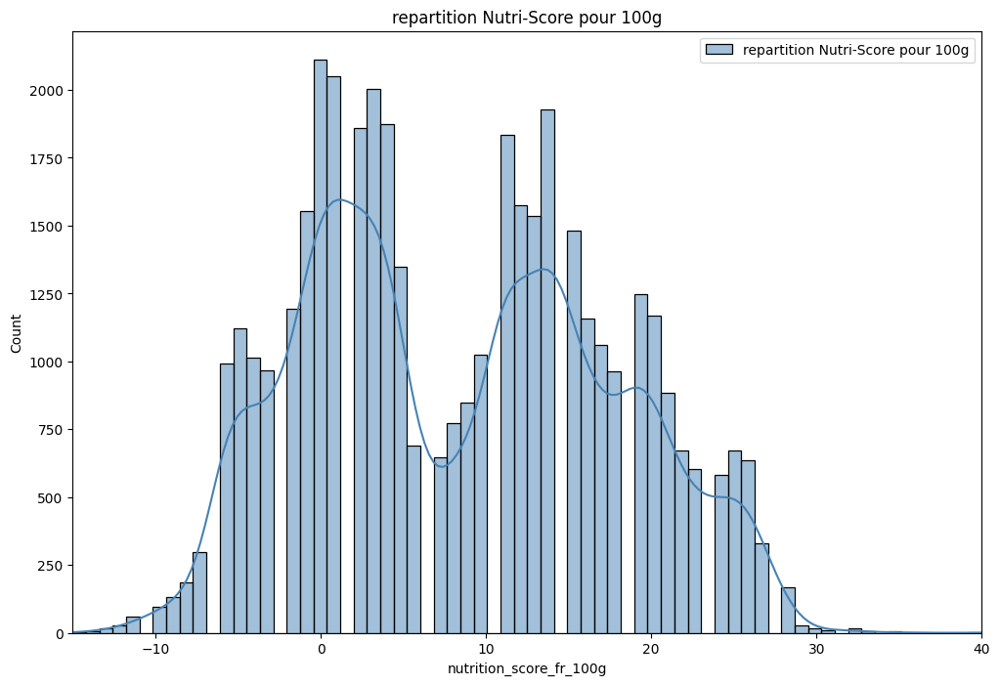

In [126]:
# Courbe de distribution du nutriscore
plot_univ(df_food_final,'nutrition_score_fr_100g','Nutri-Score', 25000)

**Remarque**:
- **La distribution est bimodale en 0 et 14, ce qui correspond aux nutri-score B et D**
- **La moyenne et la mediane sont autour d'un score de 8.5 qui correspond au nutri-score C**

**Additifs**

analyse univariée colonne additives_n
moyenne : 1.871446132659912
médiane : 1.0
ecart type : 2.590224266052246
min : 0.0
25% : 0.0
50% : 1.0
75% : 3.0
max : 31.0


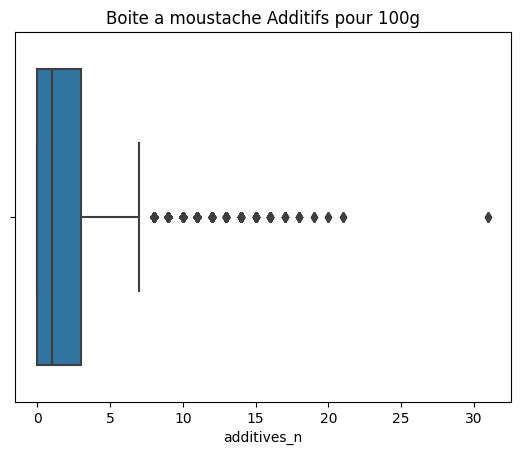

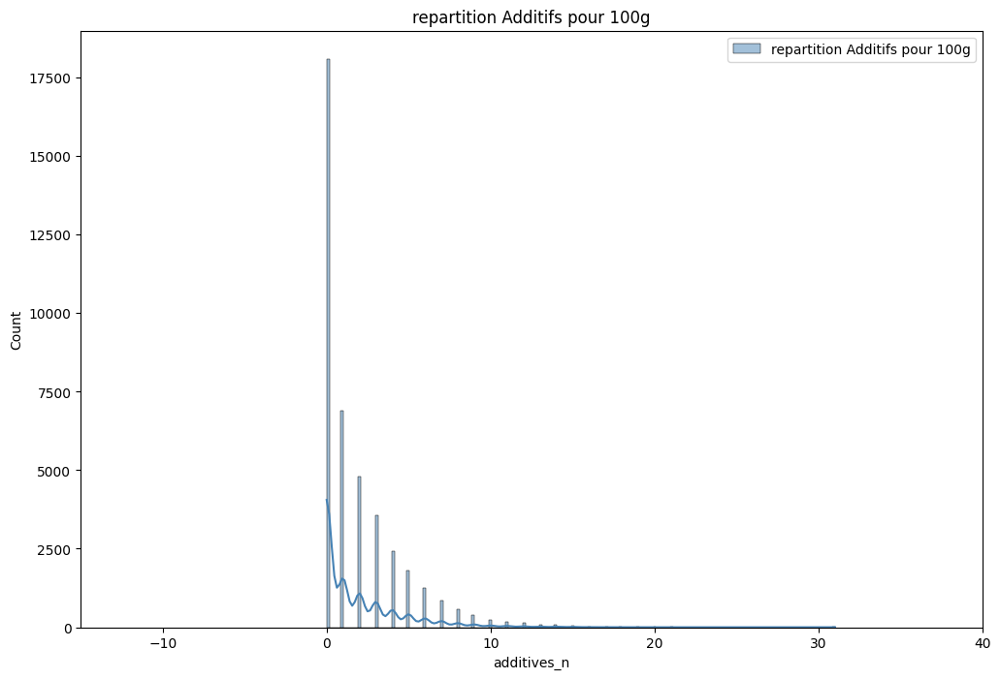

In [127]:
#Courbe de distribution Additifs 
plot_univ(df_food_final,'additives_n','Additifs',25000)

**Remarque**: 
- La majorité des produits ne contiennent pas d'additifs ou cette information n'a pas été renseignée par les unitilisateurs d'Open Food Facts 
- L'amplitude du nombre d'additif est compris entre 0 et 30 mais la moyenne est de 1 additif et il est rare de dépasser 10 additifs par produit en tenant compte des saisies des utilisateurs.

**Ingredients contenant de l'huile de palme**

analyse univariée colonne ingredients_from_palm_oil
moyenne : 0.2328968644142151
médiane : 0.0
ecart type : 0.5727797746658325
min : 0.0
25% : 0.0
50% : 0.0
75% : 0.0
max : 5.0


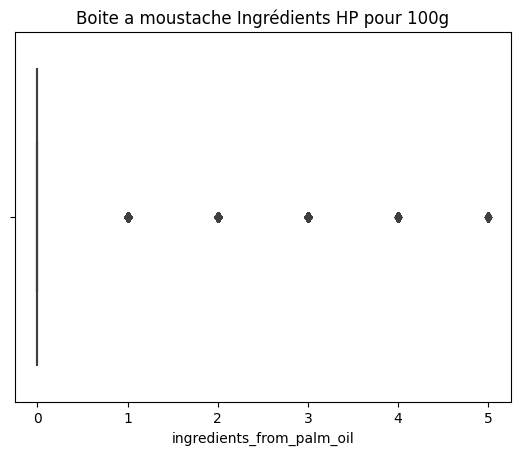

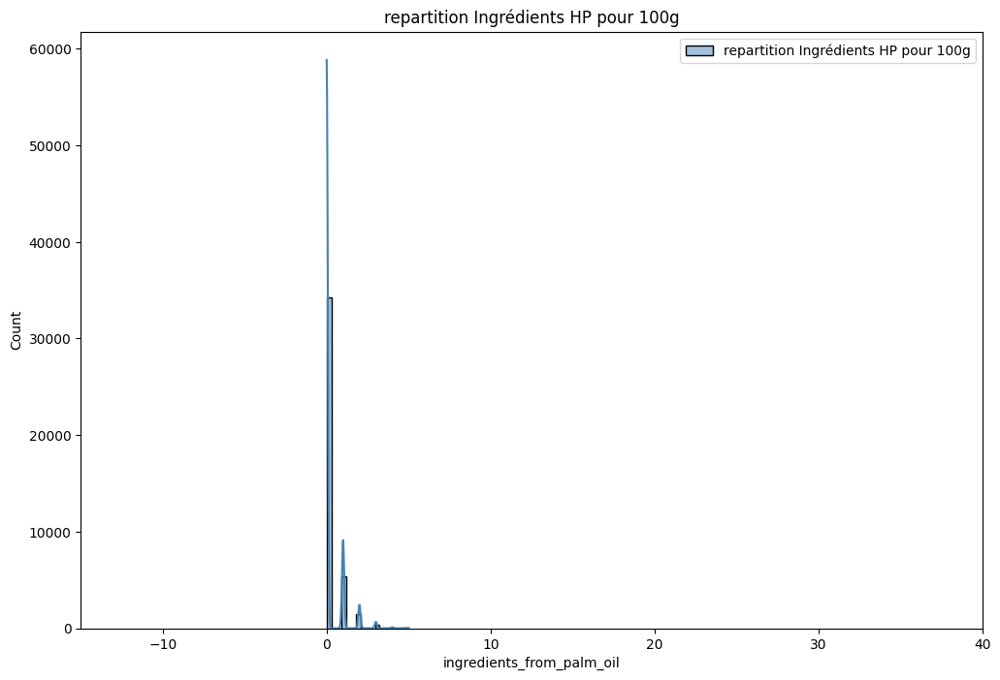

In [128]:
plot_univ(df_food_final,'ingredients_from_palm_oil','Ingrédients HP',25000)

**Remarque**:
- La quasi-totalité des produits saisis dans Open Food Facts ne contiennent pas d'huile de palme ou d'ingrédients pouvant contenir de l'huile de palme.
- L'amplitude des ingrédients contenant de l'huile de palme est compris entre 0 et 5.


#### <span style='colour:#20185e'>6.1.2. Variables qualitatives nominales</span>

In [129]:
#Représentations des variables
def plotunino(dataframe,variable,nom):
    nb_lignes=10
    dico = dataframe.groupby(variable)[variable].count().sort_values(ascending=False).to_dict()
    col1 = 'Nom_' + nom
    col2 = 'Nbr_' + nom
    col3 = 'Fréquence (%)'
    df_gpe = pd.DataFrame(dico.items(), columns=[col1, col2])
    df_gpe[col3] = (df_gpe[col2] * 100) / len(dataframe)
    df_gp_red = df_gpe.head(nb_lignes)

        # Barplot de répartition
    sns.set_style("whitegrid")
    plt.figure(figsize=(8, 4))
    sns.barplot(
        y=df_gp_red[col1],
        x=df_gp_red[col3],
        data=df_gp_red,
        color='SteelBlue')
    plt.title('Répartition du nombre de ' + nom)
    plt.grid(False)
    file = 'variable'+'_repartition.jpg'
    plt.savefig(file, bbox_inches='tight')   
    plt.tight_layout()
    plt.show()

**Pnns_Groups_1**

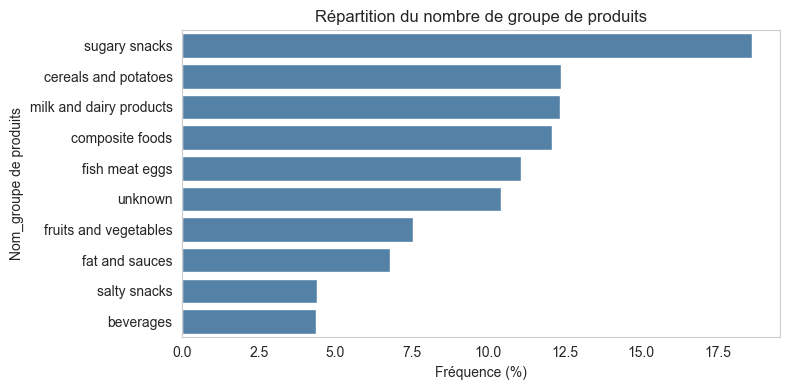

In [130]:
#Répartiton des groupes de prduits 
plotunino(df_food_final,'pnns_groups_1','groupe de produits')

**Pnns_Groups_2**

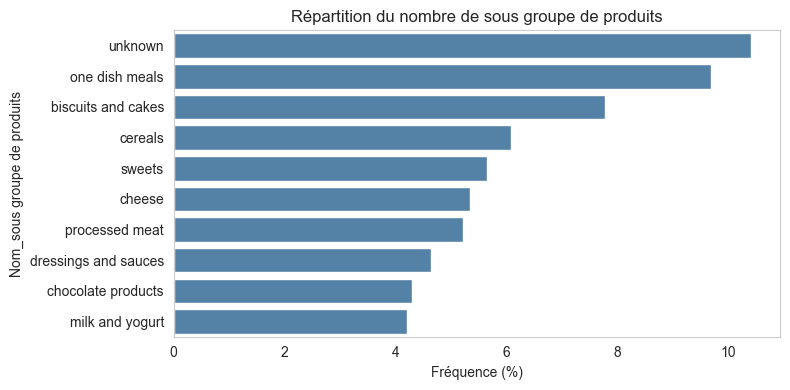

In [131]:
#Répartiton des sous-groupes de prduits 
plotunino(df_food_final,'pnns_groups_2','sous groupe de produits')

**Catégories de produits**

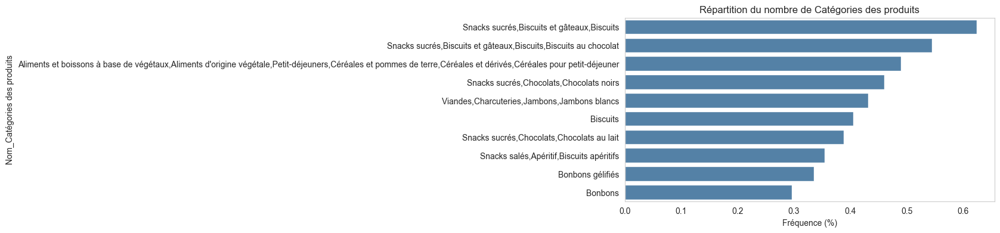

In [132]:
#Répartiton des catégories de prduits 
plotunino(df_food_final,'categories','Catégories des produits')

**Remarque**:
- La majorité des produits appartenant aux groupes de produits du haut de la liste (collation sucrée, poisson viande oeufs...), aux sous-groupes (biscuit et gateaux, repas a un plat...) et des catégories de produits comme les 'bonbons', les 'biscuits' ....sont des produits très ou ultra transformés par conséquent devraient avoir un nutri-score trés élévé 

**Produits**

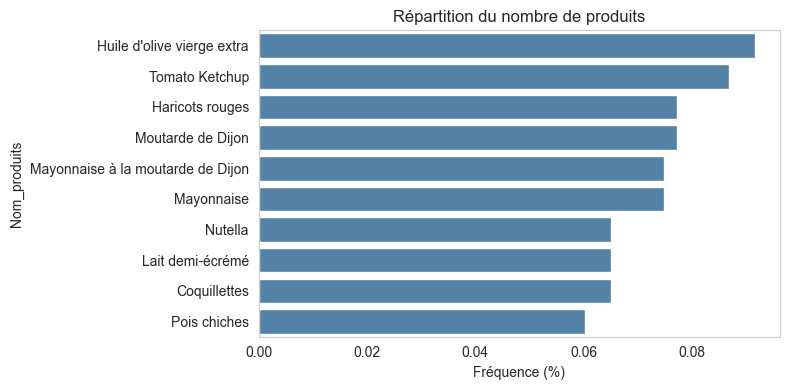

In [133]:
#Répartiton des produits 
plotunino(df_food_final,'product_name','produits')

**Remarque** : La mojorité des produits sont ultra-transformés et devraient avoir un nutri-score supérieur a 2

**Marque du produits** 

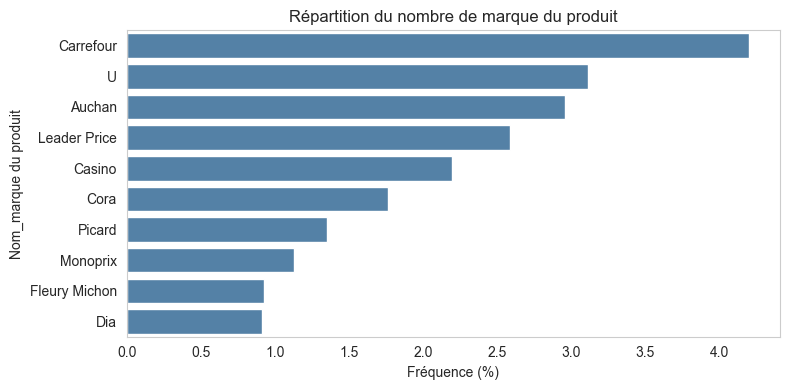

In [134]:
#Répartiton des marques de produits  
plotunino(df_food_final,'brands','marque du produit')

**Remarque** : La majorité des marques des produits sont des marques de grandes enseignes commerciales. Les produits recommandés pourront être trouvés facilement par les utilisateurs pour la suite du projet .

**Liste des additifs**

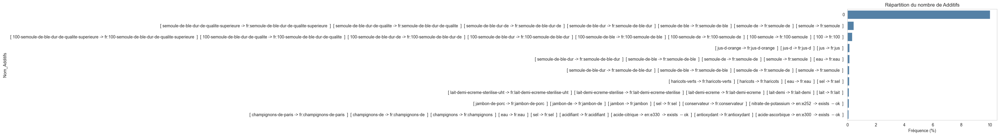

In [139]:
#Répartiton de la liste des additifs   
nb_lignes=10
nom = 'Additifs'
dico = df_food_final.groupby('additives')['additives'].count().sort_values(ascending=False).to_dict()
col1 = 'Nom_' + nom
col2 = 'Nbr_' + nom
col3 = 'Fréquence (%)'
df_gpe = pd.DataFrame(dico.items(), columns=[col1, col2])
df_gpe[col3] = (df_gpe[col2] * 100) / len(df_food_final)
df_gp_red = df_gpe.head(nb_lignes)

# Barplot de répartition
sns.set_style("whitegrid")
sns.barplot(
    y=df_gp_red[col1],
    x=df_gp_red[col3],
    data=df_gp_red,
    color='SteelBlue')
plt.title('Répartition du nombre de ' + nom)
plt.grid(False)
plt.tight_layout()
plt.show()

**Remarque** : La liste des additifs est très peu renseignée pour les produits ou non connue par les utilisateurs d'Open Food Facts.

#### <span style='colour:#20185e'>6.1.3. Variables qualitatives Oridinales</span>

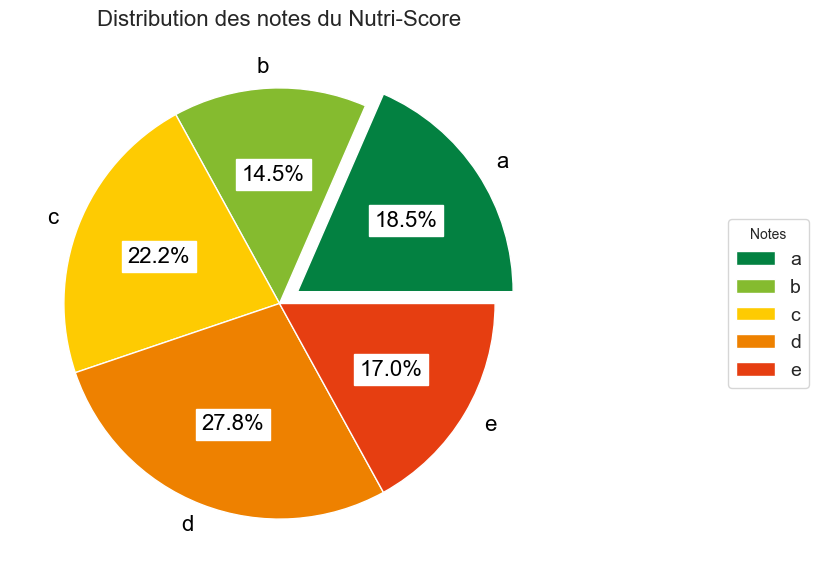

In [140]:
#Distributions des notes du nutri-score
plt.figure(figsize=(7, 7))
plt.title('Distribution des notes du Nutri-Score', size=16)
nb_par_var = df_food_final['nutrition_grade_fr'].sort_values().value_counts()
nb_par_var = nb_par_var.loc[sorted(nb_par_var.index)]
explode = [0.1]
for i in range(len(nb_par_var) - 1):
    explode.append(0)
wedges, texts, autotexts = plt.pie(nb_par_var, labels=nb_par_var.index, autopct='%1.1f%%', colors=colors_nutri, textprops={'fontsize': 16, 'color': 'black', 'backgroundcolor': 'w'}, explode=explode)
axes = plt.gca()
axes.legend(wedges,nb_par_var.index,title='Notes',loc='center right',fontsize=14,bbox_to_anchor=(1,0,0.5,1))
file = 'notes_nutri'+'_distribution.jpg'
plt.savefig(file, bbox_inches='tight')   
plt.show()

**Remarque** : Les notes majoritaires : D et C représentent plus de 50% des notes de nutri-score dans notre jeu de données nettoyé.
Les produits les plus vendus devraient être des produits mal notés du point de vue nutri-score.



#### <span style='colour:#20185e'>6.1.4. Les variables quantitatives continues</span>

**Analyses de quelques nutriments**


**Energie pour 100g**

In [141]:
def plot_univ_nutri(df,colonne,label, ylim):
    print(f'analyse univariée colonne {colonne}')
    print(f'moyenne : {df_food_final[colonne].mean()}')
    print(f'médiane : {df_food_final[colonne].median()}')
    print(f'ecart type : {df_food_final[colonne].std()}')
    print(f'min : {df_food_final[colonne].min()}')
    print(f'25% : {df_food_final[colonne].quantile(0.25)}')
    print(f'50% : {df_food_final[colonne].quantile(0.5)}')
    print(f'75% : {df_food_final[colonne].quantile(0.75)}')
    print(f'max : {df_food_final[colonne].max()}')

    sns.boxplot(x=colonne, data = df_food_final)
    plt.title('Boite a moustache '+label+' pour 100g')
    file = label+'_boxplot.jpg'
    plt.savefig(file, bbox_inches='tight')
    plt.show()    

    
    plt.figure(figsize=(12, 8))

    sns.histplot(df_food_final[colonne], kde=True,
             color='SteelBlue', label='repartition '+label+' pour 100g')
    plt.title('repartition '+label+' pour 100g')
    plt.xlim(0, 100)
    file = label+'_repartition.jpg'
    plt.savefig(file, bbox_inches='tight')    
    plt.legend()
    plt.show()

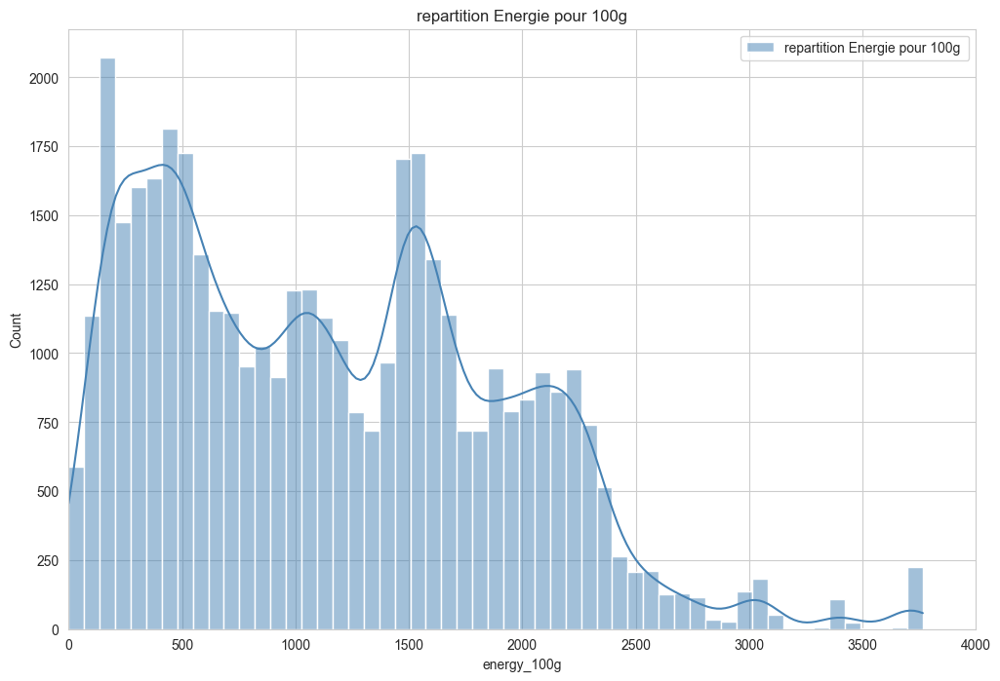

In [142]:
#distribution de l'energies
plt.figure(figsize=(12, 8))
sns.histplot(df_food_final['energy_100g'], kde=True,
         color='SteelBlue', label='repartition Energie pour 100g ')
plt.title('repartition Energie pour 100g')
plt.xlim(0, 4000)
file = 'energy'+'_repartition.jpg'
plt.savefig(file, bbox_inches='tight')   
plt.legend()
plt.show()

**Sucre**

analyse univariée colonne sugars_100g
moyenne : 13.10094928741455
médiane : 3.5999999046325684
ecart type : 18.903966903686523
min : 0.0
25% : 1.0
50% : 3.5999999046325684
75% : 18.0
max : 100.0


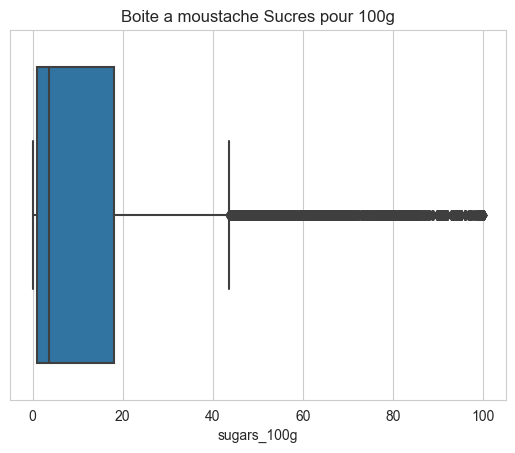

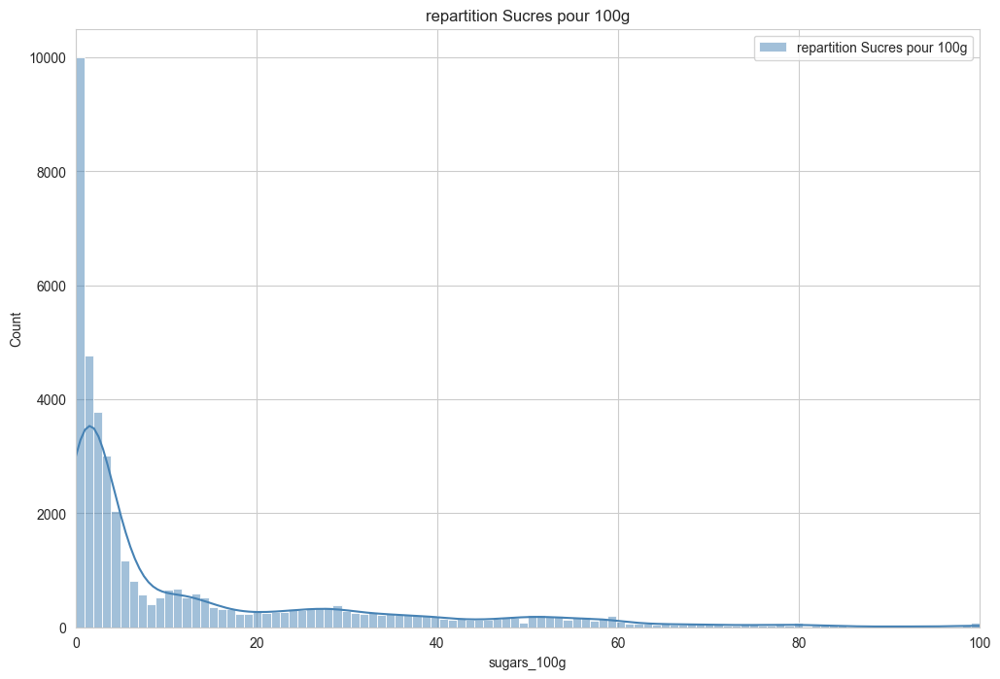

In [143]:
#distribution du sucre
plot_univ_nutri(df_food_final,'sugars_100g','Sucres', 25000)

**Sel**

analyse univariée colonne salt_100g
moyenne : 1.0443657636642456
médiane : 0.6400799751281738
ecart type : 3.236989736557007
min : 0.0
25% : 0.10000000149011612
50% : 0.6400799751281738
75% : 1.2999999523162842
max : 100.0


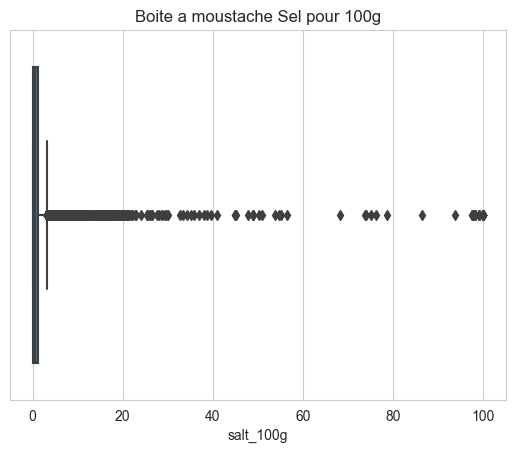

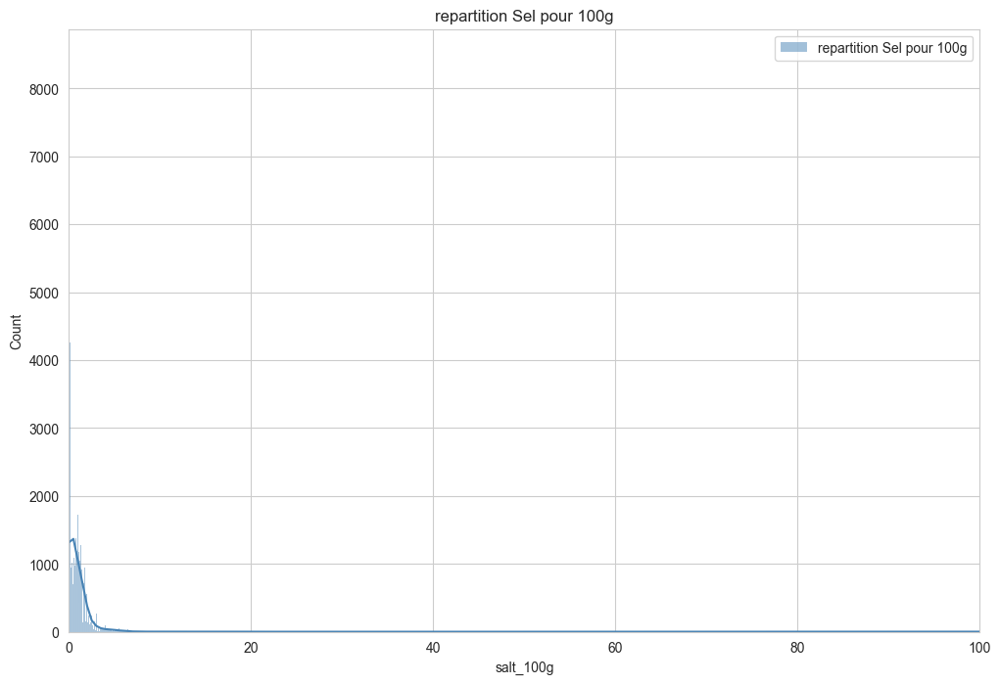

In [144]:
#distribution du sel
plot_univ_nutri(df_food_final,'salt_100g','Sel', 25000)

**Statistiques**

In [145]:
df_food_final[cols_quant_cont].describe().T

,count,mean,std,min,25%,50%,75%,max
energy_100g,41469.0,1153.512695,758.962402,0.0,481.00,1074.000000,1678.000000,3766.0
fat_100g,41469.0,14.356853,17.108305,0.0,1.90,8.000000,22.700001,100.0
saturated_fat_100g,41469.0,5.617351,8.302457,0.0,0.40,2.200000,8.000000,100.0
carbohydrates_100g,41469.0,27.676315,27.274618,0.0,3.72,15.000000,53.000000,100.0
sugars_100g,41469.0,13.100949,18.903967,0.0,1.00,3.600000,18.000000,100.0
fiber_100g,41469.0,2.691661,3.097115,0.0,1.20,2.556959,2.556959,100.0
proteins_100g,41469.0,7.975548,7.310988,0.0,2.50,6.300000,11.000000,100.0
salt_100g,41469.0,1.044366,3.236990,0.0,0.10,0.640080,1.300000,100.0


### <span style='colour:#20185e'>6.2. Analyse Bivariée</span>


#### <span style='colour:#20185e'>6.2.1. Les Variables qualitatives/quantitatives</span>

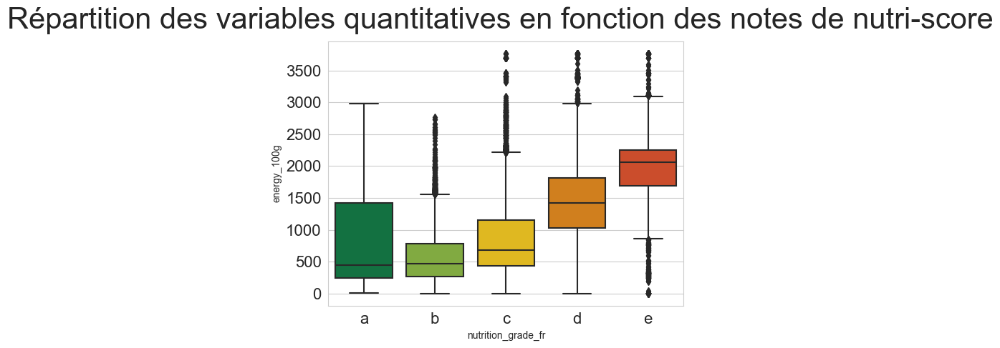

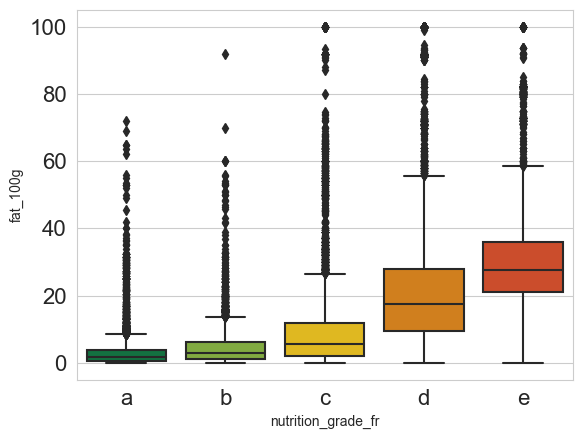

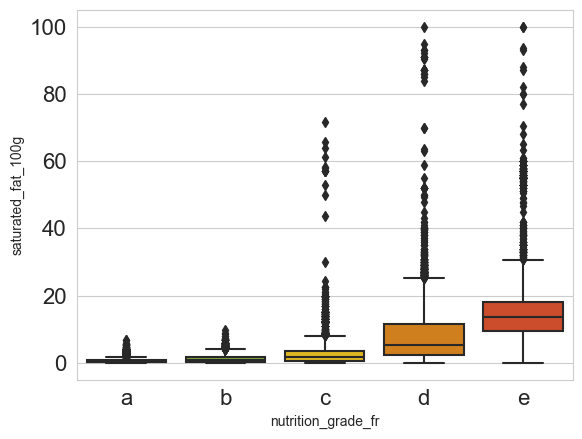

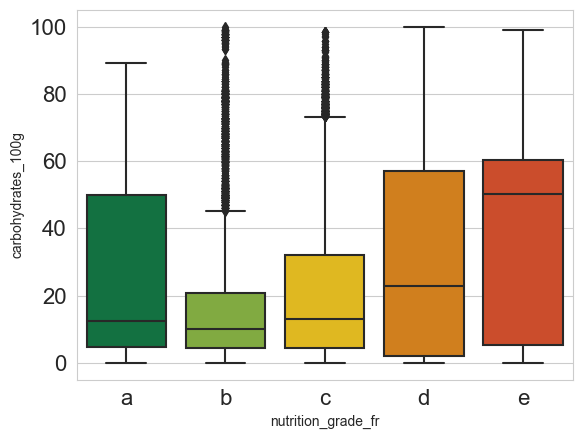

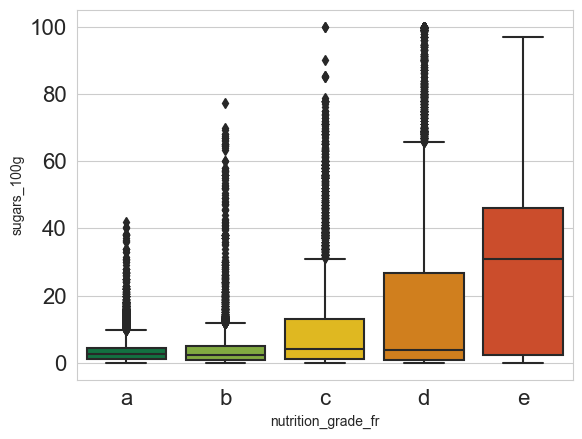

...

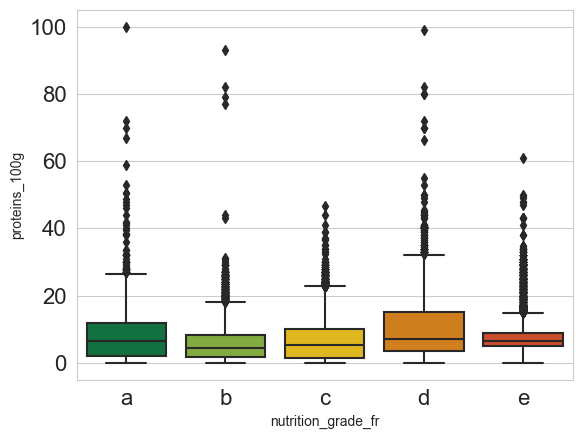

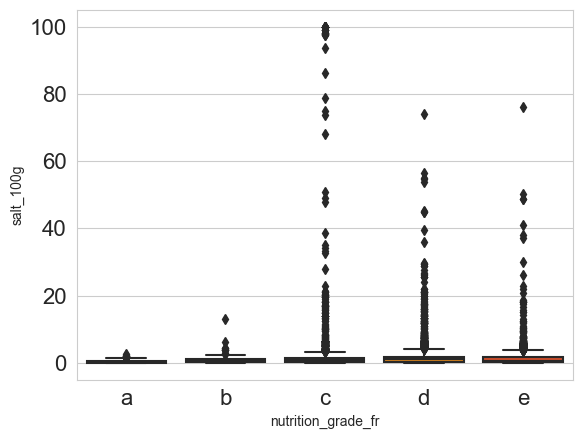

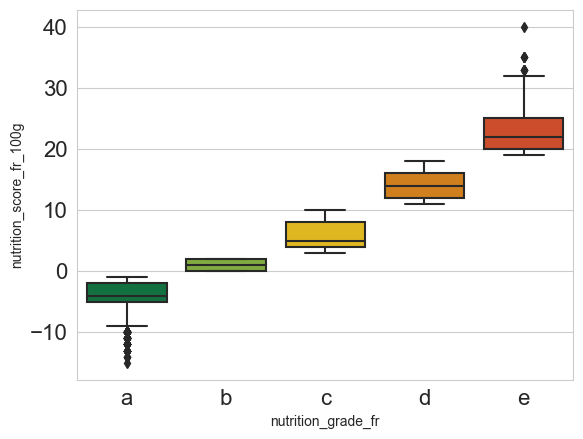

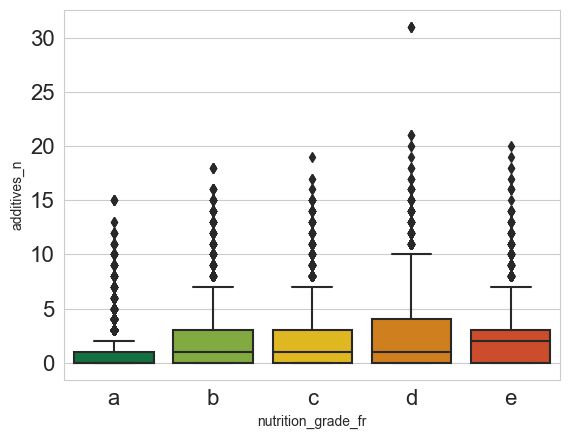

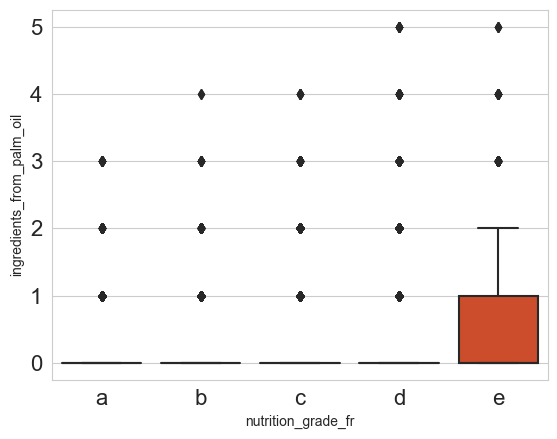

In [146]:
plt.suptitle('Répartition des variables quantitatives en fonction des notes de nutri-score', fontsize=30,)
for i, c in enumerate(cols_num, 1):
    sns.boxplot(data=df_food_final, x='nutrition_grade_fr', y=c, palette=colors_nutri)
    #plt.grid(False)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.savefig('analysebivariéenutri')
    plt.show()



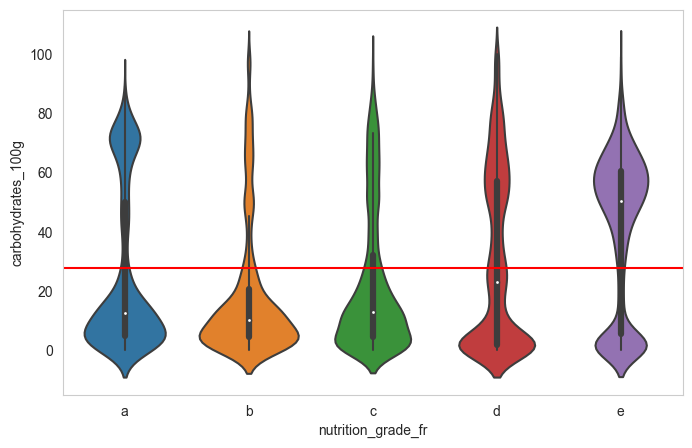

In [147]:
#Repartitions des glucides
plt.figure(figsize=[8, 5])
# Violinplot glucides/nutri-score grade
sns.violinplot(data=df_food_final, x='nutrition_grade_fr', y='carbohydrates_100g',order='abcde')
#plt.ylabel('Nombre de g de glucides pour 100g de produit', fontsize=12)
#plt.xlabel('Nutri-grade', fontsize=12)
plt.grid(False)
# Ajout moyenne des glucides pour tous les produits
moyenne_glucides = df_food_final['carbohydrates_100g'].mean()
plt.axhline(y=moyenne_glucides, color='r')
plt.show()

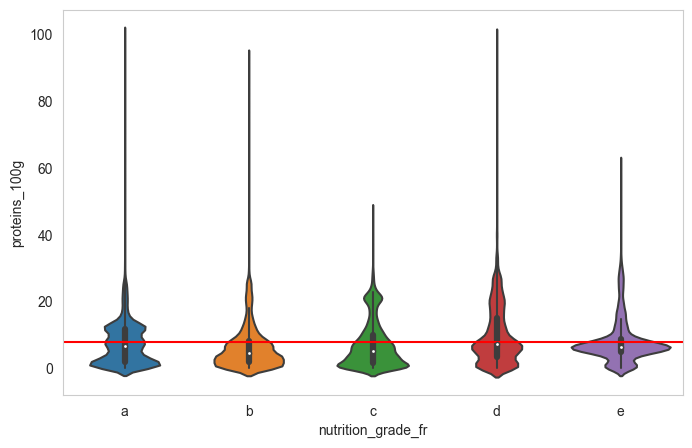

In [148]:
#Repartitions des proteines
plt.figure(figsize=[8, 5])
# Violinplot glucides/nutri-score grade
sns.violinplot(data=df_food_final, x='nutrition_grade_fr', y='proteins_100g',order='abcde')
#plt.ylabel('Nombre de g de glucides pour 100g de produit', fontsize=12)
#plt.xlabel('Nutri-grade', fontsize=12)
plt.grid(False)
# Ajout moyenne des glucides pour tous les produits
moyenne_glucides = df_food_final['proteins_100g'].mean()
plt.axhline(y=moyenne_glucides, color='r')
plt.savefig('nutri-proteins')
plt.show()

**Remarque**:

- Lipides/ acides gras saturés : plus le produit contient des lipides ou des acides gras saturés, plus le produit à un nutri-score élevé et est donc mal noté.
- Glucides/Sucres : plus le produit contient du sucre, plus le produit à un nutri-score élevé et est donc mal noté. Mais la répartition des glucides (sûrement les glucoses, fructoses (dommage de ne pas avoir assez d'informations sur la répartition des glucides)) est différente puisque certains produits contenant plus de 60g de sucre sont notés A donc très bien notés.
- Fibres : les produits contenant des fibres sont les mieux notés.
- Additifs : plus le produit contient des additifs, plus il est mal noté.
- Nutri-score : très peu de produits sont bien notés (conforme à l'analyse précédente du nutri-score grade).
- Huile de palme : plus le produit contient de l'huile de palme, plus il est mal noté mais certains produits contenant de l'huile de palme ont un nutri-score grade A (bien noté).
- Sel : plus le produit contient du sel, plus il est mal noté.
- Energie : plus le produit est mal noté, plus le produit est calorique, à l'exception de produits qui sont caloriques mais noté A.
 
Le bilan par nutriments est conforme à la définition et la répartition du nutri-score donné par Santé Publique France.


#### <span style='colour:#20185e'>6.2.2. Les Variables quantitatives/Groupes de produits</span>

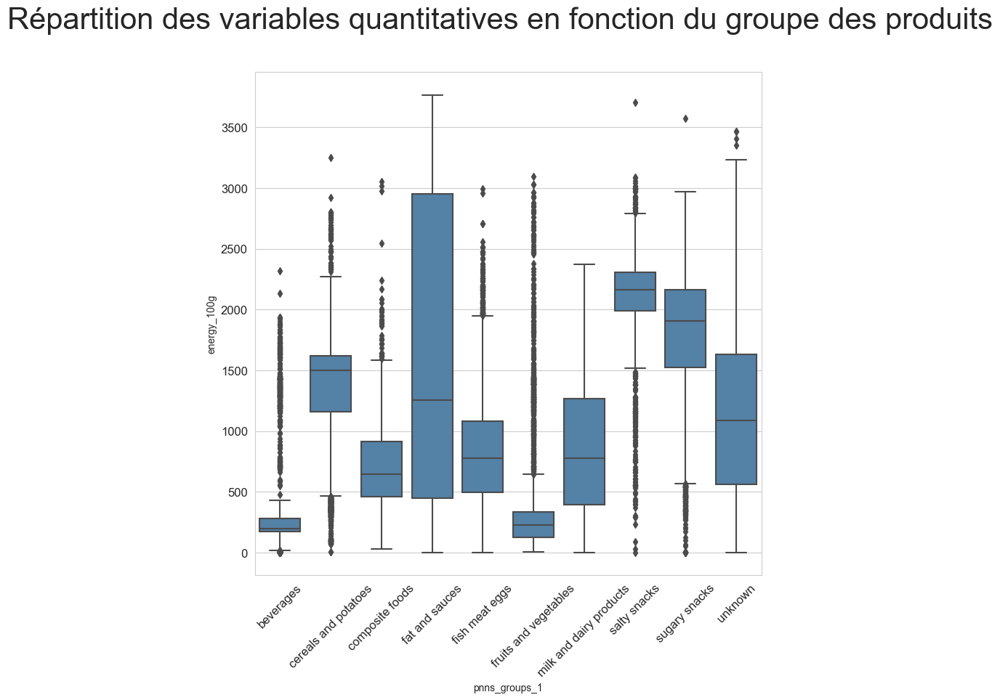

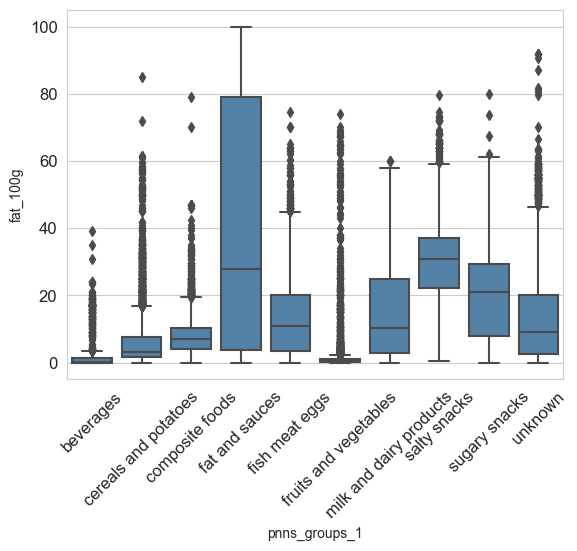

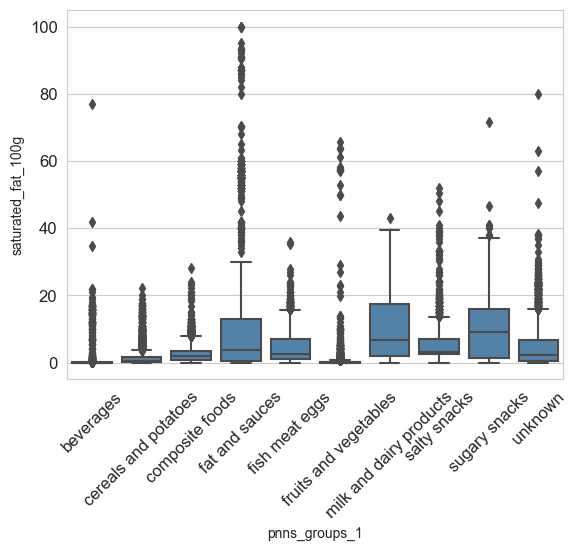

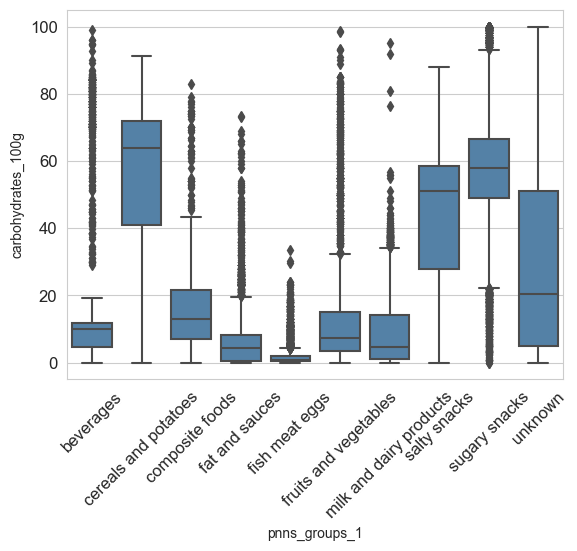

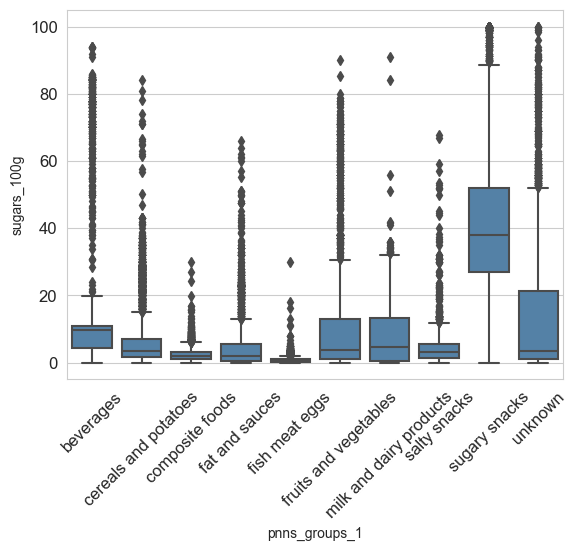

...

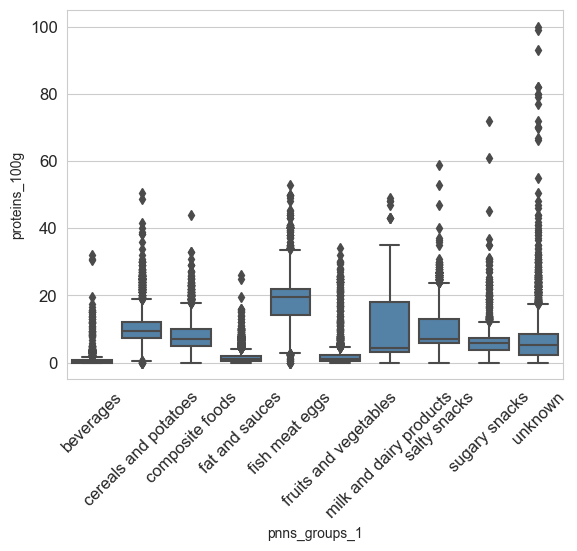

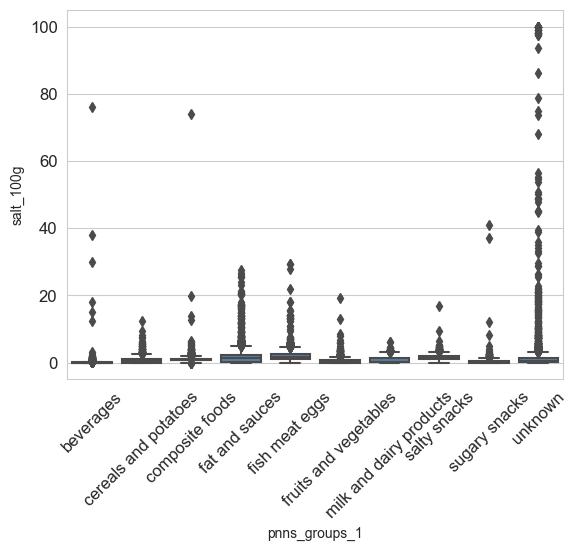

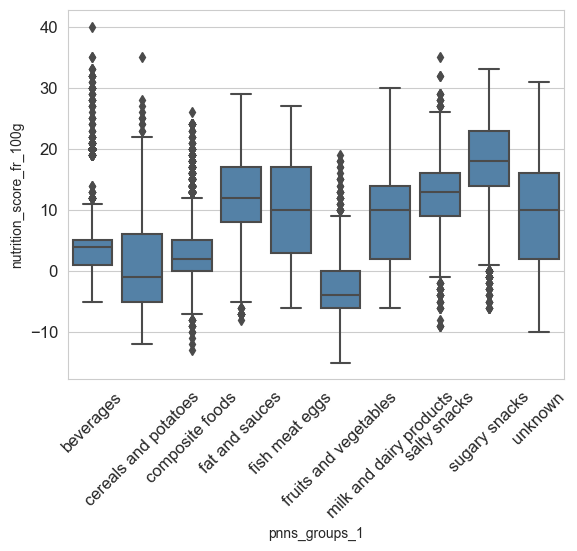

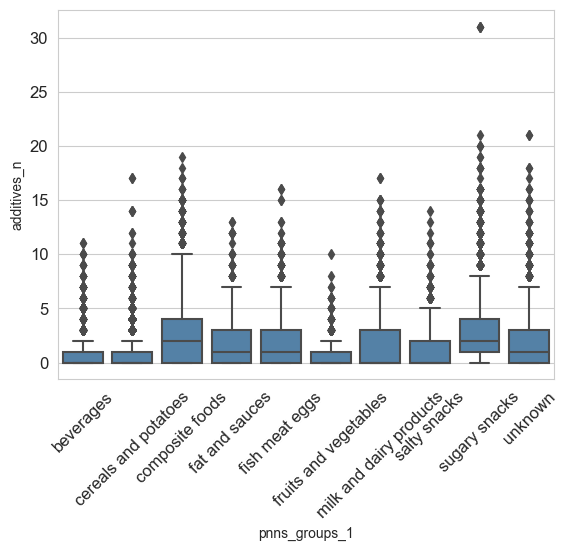

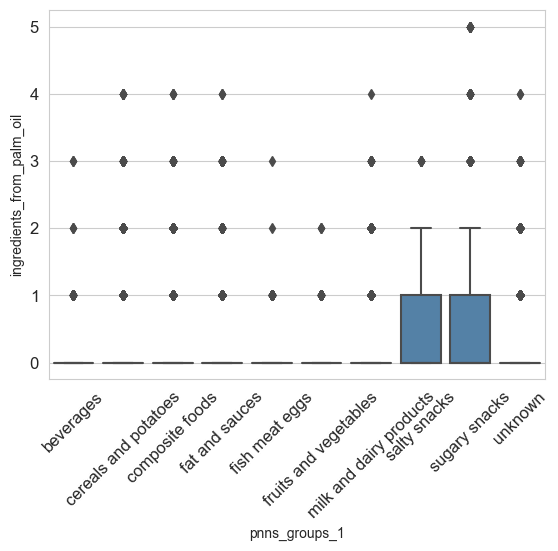

In [149]:
fig = plt.figure(figsize=(9,9))
plt.suptitle('Répartition des variables quantitatives en fonction du groupe des produits', fontsize=30,)


for i, c in enumerate(cols_num, 1):
    sns.boxplot(data=df_food_final, x='pnns_groups_1', y=c, color='SteelBlue')
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)
    plt.savefig('bivariéé')
    plt.show()



**Bilan**

- Les distributions sont conformes à la nature des produits, les matières grasses contiennent beaucoup de lipides et ont une forte énergie nutritionnelle, les collations sucrées contiennent beaucoup de glucides...

**Protéines/Groupes de produits**

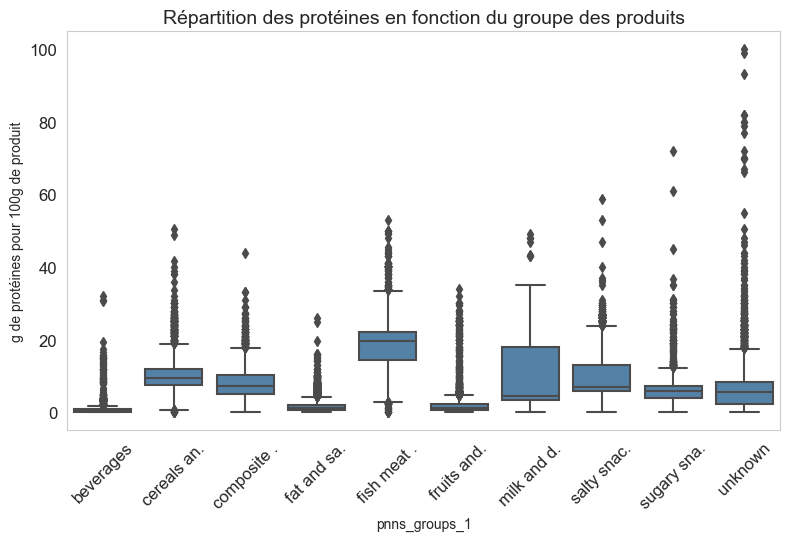

In [150]:
fig = plt.figure(figsize=(8, 6))

ax = fig.add_subplot(1, 1, 1)
sns.boxplot(data=df_food_final, x='pnns_groups_1',
            y='proteins_100g', color='SteelBlue', ax=ax)
plt.grid(False)
labels = [item.get_text() for item in ax.get_xticklabels()]
short_labels = [s[0:10]+'.' if len(s) > 10 else s for s in labels]
ax.set_xticklabels(short_labels)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.ylabel('g de protéines pour 100g de produit')
plt.title(
    'Répartition des protéines en fonction du groupe des produits', fontsize=14,)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig('prot-nutri')
plt.show()

**Remarque**: 
- Les protéines sont représentées dans tous les groupes de produits, même dans le groupe des boissons.
- Une forte proportion de protéines pour les viandes, poissons, oeufs et les produits laitiers, mais chaque groupe de produit contient des outliers dépassant les 40g de protéines pour 100g de produits.

**Nutri-Score/Nutri-grade**

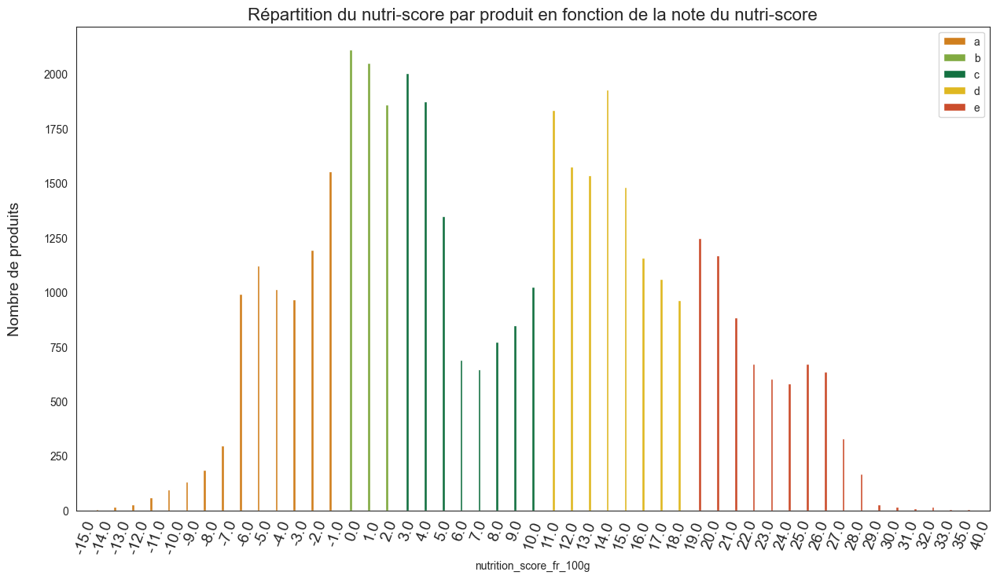

In [151]:
plt.figure(figsize=(15, 8))
sns.set_style("white")
sns.countplot(x='nutrition_score_fr_100g', hue='nutrition_grade_fr', data=df_food_final,
              palette=colors_nutri_nosort)

plt.legend(loc=1)
plt.ylabel('Nombre de produits', labelpad=20, fontsize=14)
plt.xticks(rotation=70, fontsize=14)
plt.title(
    'Répartition du nutri-score par produit en fonction de la note du nutri-score', fontsize=16)
plt.savefig('nutri-produit')
plt.show()

**Matrice de Corrélation**

In [152]:
plt.figure(figsize=(10, 10))
df_food_final[cols_num].corr(method='spearman').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'))

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition_score_fr_100g,additives_n,ingredients_from_palm_oil
energy_100g,1.0,0.74,0.64,0.46,0.27,0.32,0.29,0.049,0.67,0.082,0.25
fat_100g,0.74,1.0,0.89,-0.085,-0.033,0.14,0.36,0.32,0.67,0.088,0.2
saturated_fat_100g,0.64,0.89,1.0,-0.075,0.013,0.074,0.37,0.27,0.72,0.14,0.24
carbohydrates_100g,0.46,-0.085,-0.075,1.0,0.67,0.33,-0.12,-0.3,0.15,0.16,0.28
sugars_100g,0.27,-0.033,0.013,0.67,1.0,0.12,-0.31,-0.38,0.32,0.2,0.23
fiber_100g,0.32,0.14,0.074,0.33,0.12,1.0,0.22,0.015,-0.039,-0.021,0.07
proteins_100g,0.29,0.36,0.37,-0.12,-0.31,0.22,1.0,0.44,0.11,-0.033,-0.016
salt_100g,0.049,0.32,0.27,-0.3,-0.38,0.015,0.44,1.0,0.3,0.19,0.059
nutrition_score_fr_100g,0.67,0.67,0.72,0.15,0.32,-0.039,0.11,0.3,1.0,0.26,0.25
additives_n,0.082,0.088,0.14,0.16,0.2,-0.021,-0.033,0.19,0.26,1.0,0.44


<Figure size 1000x1000 with 0 Axes>


#### <span style='colour:#20185e'>6.2.3. Les Variables quantitatives/quantitatives</span>

**Proteines/Nutriments** 

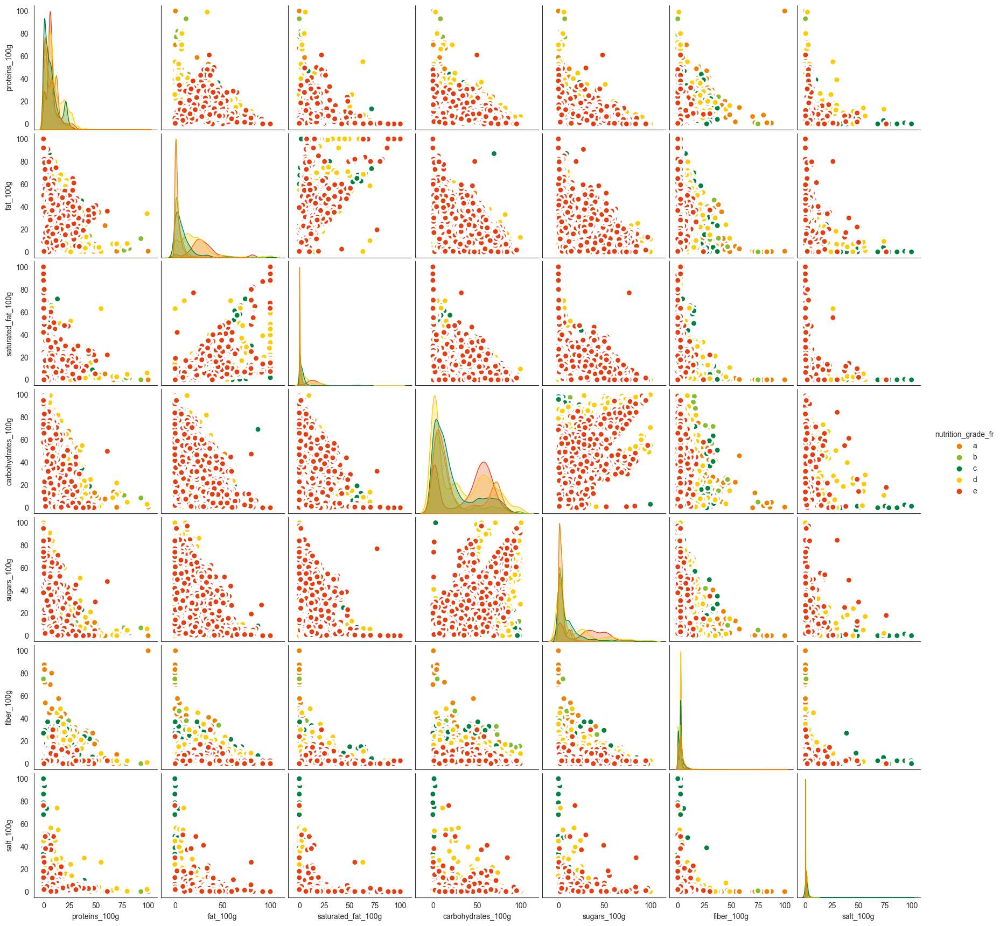

In [153]:
cols_nutri = ['proteins_100g', 'fat_100g', 'saturated_fat_100g',
              'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'salt_100g',
              'nutrition_grade_fr']

sns.set_style("white")
sns.pairplot(df_food_final[cols_nutri], kind='scatter', hue='nutrition_grade_fr',
             palette=colors_nutri_nosort, plot_kws=dict(s=80, edgecolor="white",
                                                        linewidth=2.5))   
plt.show()

**Protéines/Nutri-score**

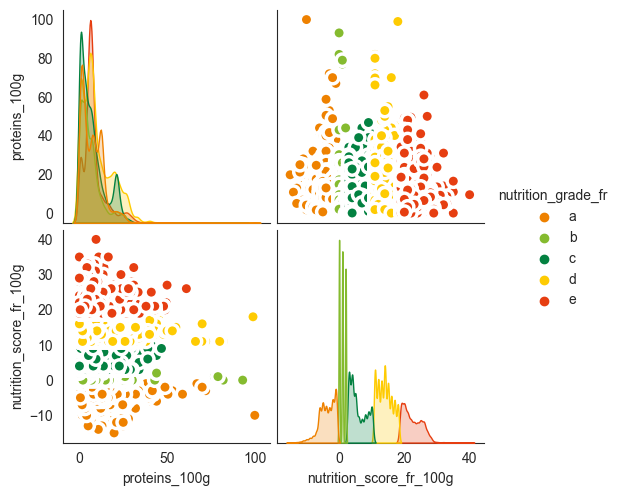

In [171]:
cols_score = ['proteins_100g', 'nutrition_score_fr_100g', 'nutrition_grade_fr']
sns.set_style("white")
sns.pairplot(df_food_final[cols_score], kind='scatter', hue='nutrition_grade_fr',
             palette=colors_nutri_nosort, plot_kws=dict(s=80, edgecolor="white",
                                                        linewidth=2.5))
plt.show()

**Protéines/Energie**

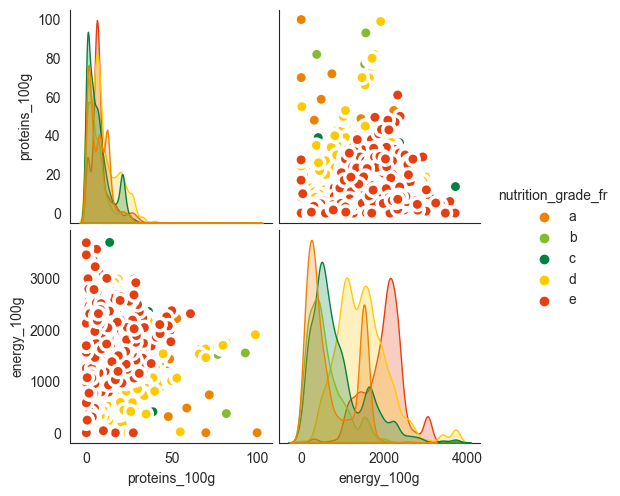

In [390]:
cols_enr = ['proteins_100g', 'energy_100g', 'nutrition_grade_fr']
sns.set_style("white")
sns.pairplot(df_food_final[cols_enr], kind='scatter', hue='nutrition_grade_fr',
             palette=colors_nutri_nosort, plot_kws=dict(s=80, edgecolor="white",
                                                        linewidth=2.5))
plt.savefig('_pairplotPRO/Energy.jpg') 
plt.show()

### <span style='colour:#20185e'>6.3. Analyse Multivariée</span>

**ACP**

In [172]:
# Sélection des colonnes pour l'ACP
cols_acp = df_food_final.select_dtypes(include=[np.number]).columns.to_list()
# Nombre de composantes
n_comp = len(cols_acp)
# Données pour l'ACP
data_acp = df_food_final[cols_acp]
# Noms affichés
names = df_food_final['product_name']
features = data_acp.columns
X = data_acp.values

In [173]:
# Centrage et Réduction - Mise à l'échelle
std_scaler = preprocessing.StandardScaler().fit(X)
X_scaled = std_scaler.transform(X)

In [174]:
# Calcul des composantes principales
pca = decomposition.PCA(n_components=n_comp)
pca.fit(X_scaled)

PCA(n_components=11)

In [175]:
# Bruit estimé lié à la covariance
print(pca.noise_variance_)

0.0


In [176]:
# Valeurs propres ou variances des composantes principales
pca.explained_variance_ratio_

array([0.2971946 , 0.1828768 , 0.12554468, 0.10508813, 0.09047037,
       0.06754937, 0.04823522, 0.03982041, 0.02599451, 0.01597052,
       0.00125533], dtype=float32)

In [177]:
def pareto(data) :
    from matplotlib.ticker import PercentFormatter
    y = list(data)
    x = range(len(data))
    ycum = np.cumsum(y)/sum(y)*100
    fig, ax = plt.subplots()
    ax.bar(x,y,color="yellow")
    ax2 = ax.twinx()
    ax2.plot(x,ycum, color="C1", marker="D", ms=7)
    ax2.axhline(y=80,color="r")
    ax2.yaxis.set_major_formatter(PercentFormatter())
    ax.tick_params(axis="y", colors="C0")
    ax2.tick_params(axis="y", colors="C1")
    plt.ylim(0,110)
    plt.show()

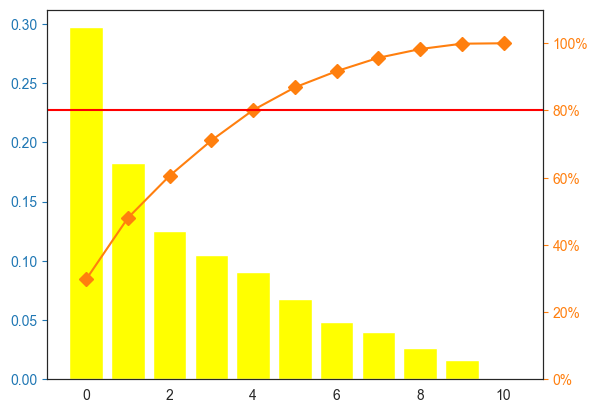

In [178]:
pareto(pca.explained_variance_ratio_)

**Remarque**:  
- En premier lieu on avait fixé le nombre de composants par rapport au nombre de variables mais d'aprés les ratios de la variance expliquée sur la variance totale pour chaque axe principal, il n'est pas pertinent de choisir les 11 composants en totalité.

- Suivant le prinicpe du **critere de kaiser** pour choisir le nombre d'axes intéréssants pour notre analyse, nous allons retenir les valeurs propres qui “dominent” les autres, en se référant au graphique par conséquent nous alons réduire a **5 composants** qui correpond au moment ou on atteint 80% de taux cumulé de variances.

In [180]:
# Nombre de composantes
n_comp = 5
# Données pour l'ACP
data_acp = df_food_final[cols_acp]
# Noms affichés
names = df_food_final['product_name']
features = data_acp.columns
X = data_acp.values

In [181]:
# Centrage et Réduction - Mise à l'échelle
std_scaler = preprocessing.StandardScaler().fit(X)
X_scaled = std_scaler.transform(X)

In [182]:
# Calcul des composantes principales
pca = decomposition.PCA(n_components=n_comp)
pca.fit(X_scaled)

PCA(n_components=5)

In [183]:
# Valeurs propres ou variances des composantes principales
pca.explained_variance_ratio_

array([0.29719466, 0.18287684, 0.12554473, 0.10508804, 0.09047038],
      dtype=float32)

In [184]:
df_acp = pd.DataFrame(pca.components_,
                      index=['PC'+str(i+1) for i in range(n_comp)],
                      columns=cols_acp).T
df_acp

,PC1,PC2,PC3,PC4,PC5
energy_100g,0.505090,-0.047408,0.184296,0.088749,-0.020975
fat_100g,0.425446,-0.348884,-0.031128,-0.090948,-0.155926
saturated_fat_100g,0.410077,-0.303818,-0.063964,-0.148994,-0.119801
carbohydrates_100g,0.231167,0.500113,0.304415,0.119233,0.154460
sugars_100g,0.261470,0.463342,0.197942,-0.228442,0.220810
fiber_100g,0.060142,0.019821,0.470606,0.616283,-0.097117
proteins_100g,0.038229,-0.361996,0.055708,0.527384,0.086429
salt_100g,-0.012751,-0.151630,-0.237987,0.177141,0.870334
nutrition_score_fr_100g,0.472769,-0.023480,-0.137346,-0.123624,0.214809
additives_n,0.103809,0.295373,-0.559411,0.290335,-0.132028


**Matrices des ACP**

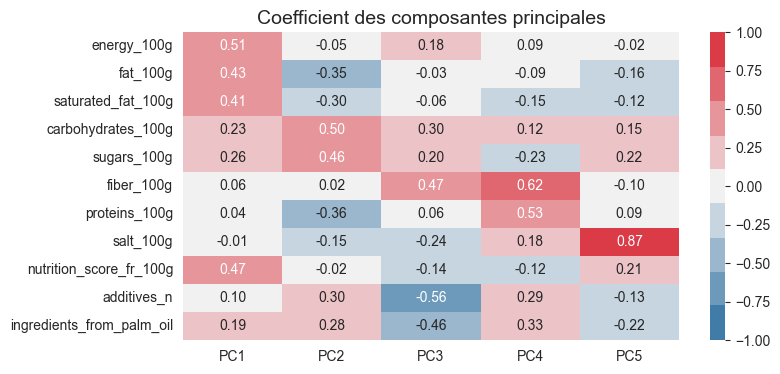

In [185]:
# Matrice des coefficients des composantes principales
fig, ax = plt.subplots(figsize=(8, 4))
palette = sns.diverging_palette(240, 10, n=9)
ax = sns.heatmap(df_acp, annot=True, fmt='.2f',
                 cmap=palette, vmin=-1, vmax=1, center=0)
plt.title('Coefficient des composantes principales', fontsize=14)
plt.show()

**Diagramme des eblouis des valeurs propres**

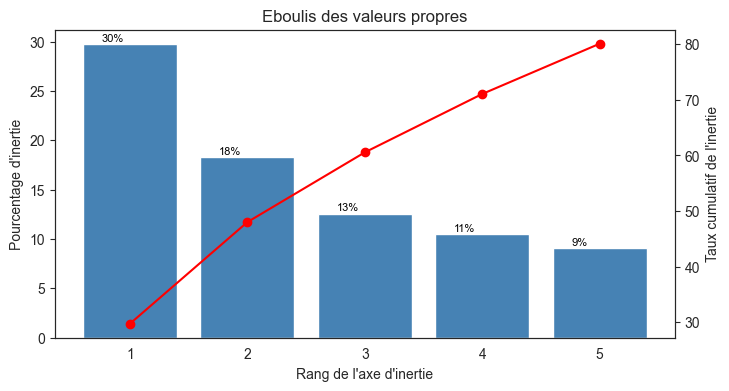

In [186]:
taux_var_exp = pca.explained_variance_ratio_
scree = taux_var_exp * 100
plt.bar(np.arange(len(scree)) + 1, scree, color='SteelBlue')
ax1 = plt.gca()
ax2 = ax1.twinx()
ax2.plot(np.arange(len(scree)) + 1, scree.cumsum(), c='red', marker='o')
ax2.set_ylabel('Taux cumulatif de l\'inertie')
ax1.set_xlabel('Rang de l\'axe d\'inertie')
ax1.set_ylabel('Pourcentage d\'inertie')
for i, p in enumerate(ax1.patches):
    ax1.text(
    p.get_width() /
    5 +
    p.get_x(),
    p.get_height() +
    p.get_y() +
    0.3,
    '{:.0f}%'.format(
        taux_var_exp[i] *
        100),
    fontsize=8,
    color='k')
plt.title('Eboulis des valeurs propres')
plt.gcf().set_size_inches(8, 4)
plt.grid(False)
plt.show(block=False)

Aucun coude sur le graphique de l'éboulis des valeurs propres. La première composante explique pour 30% la variance totale.

**Affichage du cercle des corrélations**

In [187]:
#Le nombre de composants
pcs = pca.components_
pcs

array([[ 0.5050898 ,  0.42544562,  0.41007656,  0.23116685,  0.2614705 ,
         0.0601417 ,  0.03822942, -0.01275072,  0.47276947,  0.10380939,
         0.18542968],
       [-0.04740771, -0.3488835 , -0.30381823,  0.50011337,  0.46334177,
         0.01982082, -0.36199597, -0.15163036, -0.02347969,  0.29537258,
         0.27695903],
       [ 0.18429641, -0.03112845, -0.06396351,  0.30441496,  0.19794227,
         0.4706063 ,  0.05570779, -0.23798665, -0.13734594, -0.5594106 ,
        -0.46487594],
       [ 0.08874927, -0.09094787, -0.14899392,  0.11923307, -0.22844191,
         0.6162826 ,  0.52738374,  0.17714126, -0.12362374,  0.2903349 ,
         0.3261228 ],
       [-0.02097541, -0.15592645, -0.11980112,  0.15446046,  0.22081049,
        -0.0971167 ,  0.08642861,  0.8703341 ,  0.21480903, -0.13202754,
        -0.22432572]], dtype=float32)

In [188]:
#dataframe :
df_acp

,PC1,PC2,PC3,PC4,PC5
energy_100g,0.505090,-0.047408,0.184296,0.088749,-0.020975
fat_100g,0.425446,-0.348884,-0.031128,-0.090948,-0.155926
saturated_fat_100g,0.410077,-0.303818,-0.063964,-0.148994,-0.119801
carbohydrates_100g,0.231167,0.500113,0.304415,0.119233,0.154460
sugars_100g,0.261470,0.463342,0.197942,-0.228442,0.220810
fiber_100g,0.060142,0.019821,0.470606,0.616283,-0.097117
proteins_100g,0.038229,-0.361996,0.055708,0.527384,0.086429
salt_100g,-0.012751,-0.151630,-0.237987,0.177141,0.870334
nutrition_score_fr_100g,0.472769,-0.023480,-0.137346,-0.123624,0.214809
additives_n,0.103809,0.295373,-0.559411,0.290335,-0.132028


In [189]:
import matplotlib.pyplot as plt
from importlib import reload
plt=reload(plt)

In [196]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('PC{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('PC{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    # J'ai copié collé le code sans le lire
    plt.title("Cercle des corrélations (PC{} et PC{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.savefig('cercle de corrélations') 
    plt.show(block=False)

**PC1 et PC2**

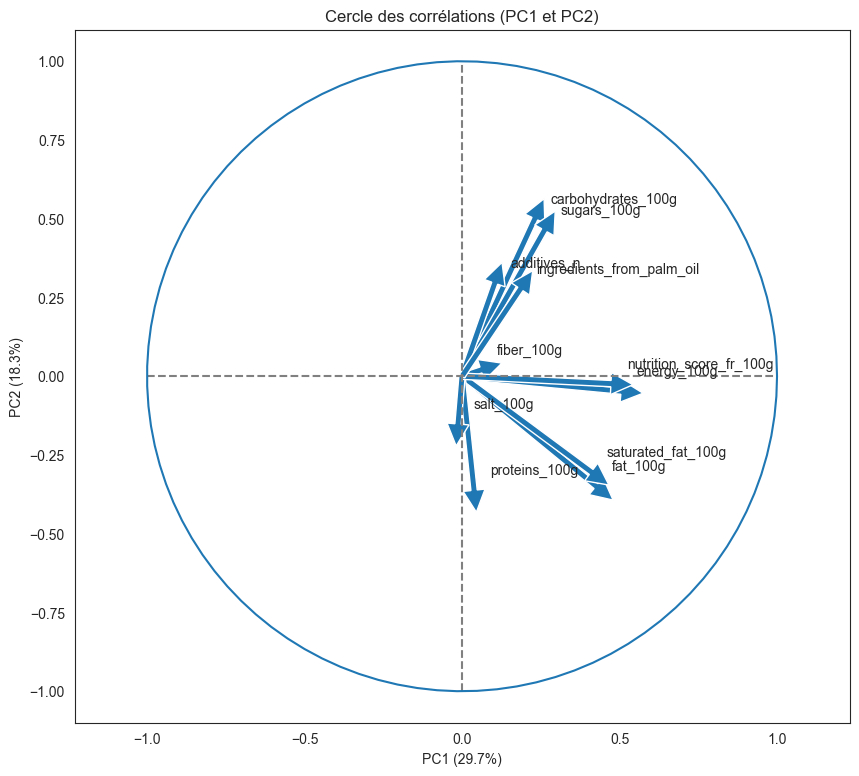

In [197]:
correlation_graph(pca, (0,1), features)

**PC3 et PC4**

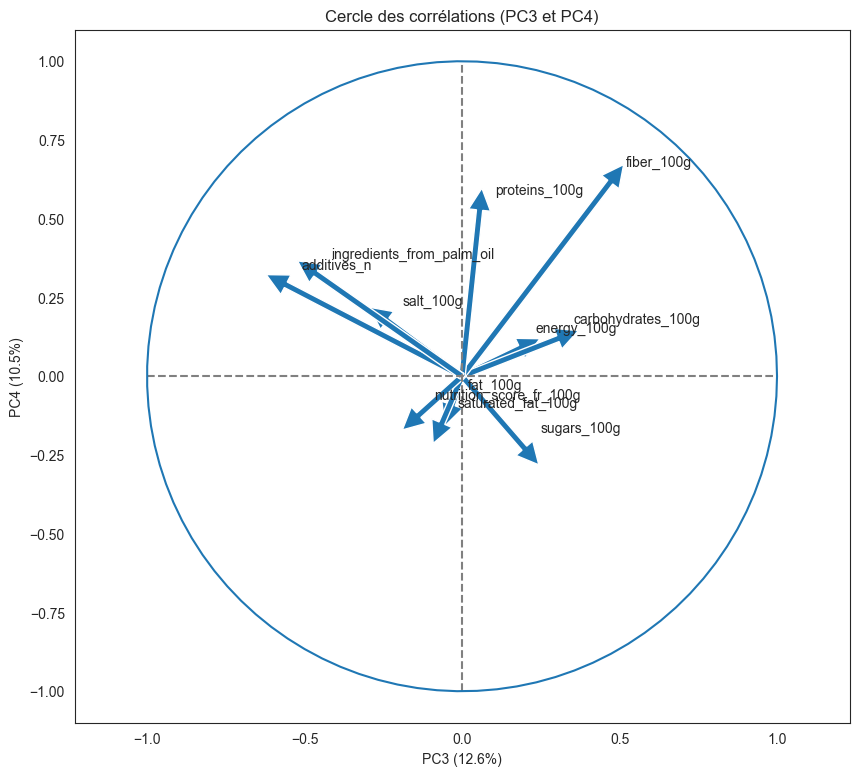

In [198]:
correlation_graph(pca, (2,3), features)

- On retrouve les corrélations entre les glucides et le sucre, les lipides et les acides gras saturés.
****
Mêmes conclusions qu'avec l'analyse multi-variée :
- Les lipides augmente sans surprise avec les acides gras saturés (un sous-groupe des lipides). Les produits à forte teneur en lipides ont tendance à contenir moins de glucides, de fibres et d'additifs.
- Les produits avec une forte teneur en glucides ont tendance à avoir moins de lipdes, de sel et moins de protéines.
- Les produits à forte teneur en protéines ont une tendance à contenir moins de glucides, moins d'additifs et moins d'ingrédients contenant de l'huile de palme. Plus le produit contient des protéines moins le produit est transformé.
- Les additifs sont très présents dans les produits très ou ultra transformés.
- Les produits les moins transformés contiennent plus de fibres et de protéines.
- L'énrgie nutritionnelle augmente avec les produits contenant des lipdes et des glucides et plus l'énergie est élevée plus le nutri-score est élevé (donc le produit est mal noté).les produits contenant plus de protéines contiennent moins de glucides.


**Projections**


In [199]:
def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[10,8], 
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters
 
    # Les points    
    # plt.scatter(   X_[:, x], X_[:, y], alpha=alpha, 
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'PC{x+1} {v1}')
    ax.set_ylabel(f'PC{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        # j'ai copié collé la fonction sans la lire
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.title(f"Projection des individus (sur PC{x+1} et PC{y+1})")
    plt.savefig('projections des individus') 
    plt.show()



**PC1 et PC2**

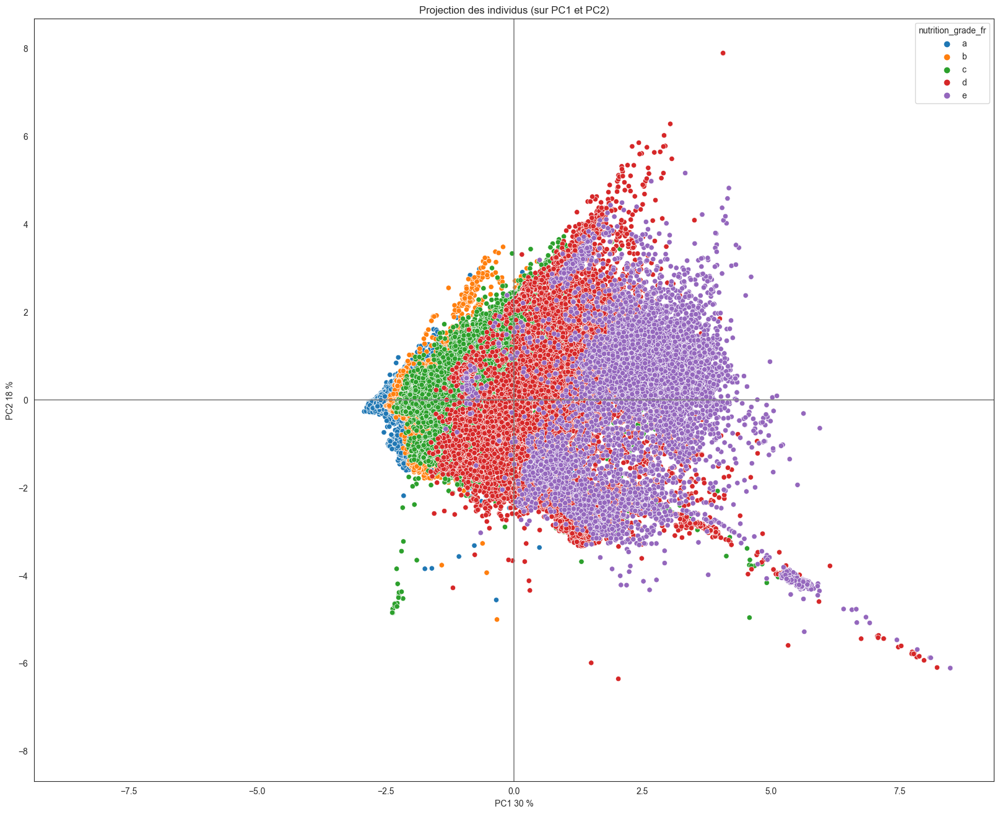

In [200]:
x_y = [0,1]
X_ech_index = df_food_final.loc[:, cols_acp].sample(300).index
X_proj = pca.transform(X_scaled)
display_factorial_planes(X_proj, x_y, pca, labels=None, figsize=(20,16), clusters=df_food_final['nutrition_grade_fr'], marker="o")

**PC3 et PC4**

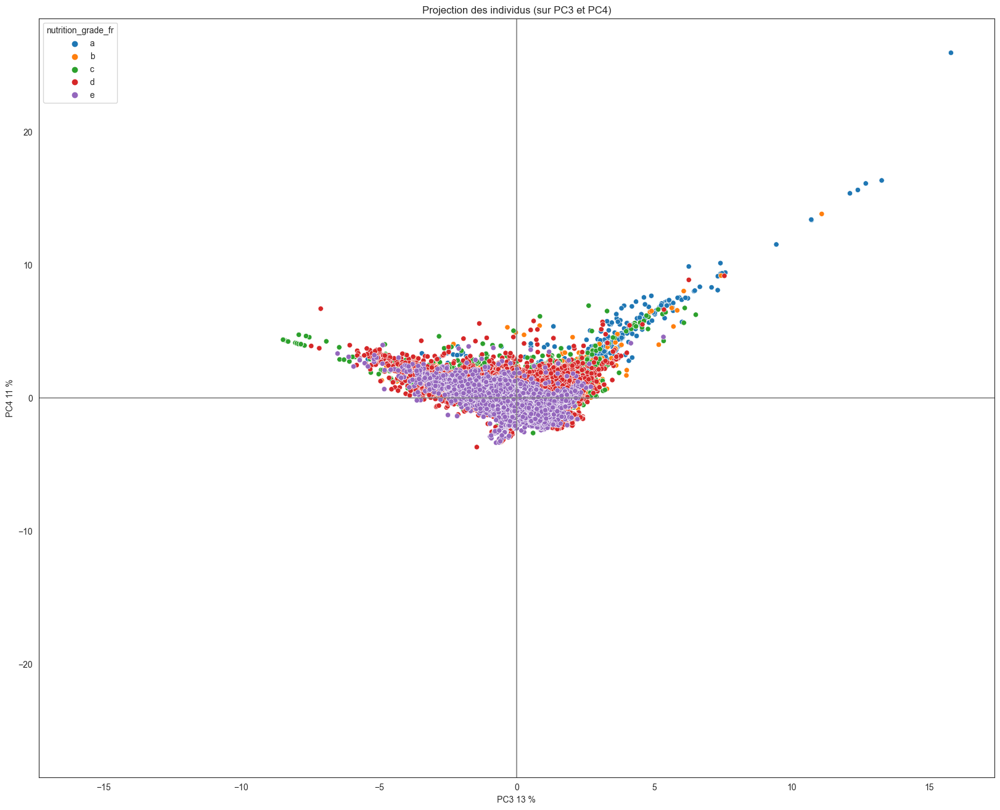

In [201]:
x_y = [2,3]
X_ech_index = df_food_final.loc[:, cols_acp].sample(300).index
X_proj = pca.transform(X_scaled)
display_factorial_planes(X_proj, x_y, pca, labels=None, figsize=(20,16), clusters=df_food_final['nutrition_grade_fr'], marker="o")

## <span style='background:pink'>7. Conclusion  </span>

Le jeu de données contient toutes les données nécessaires à notre idée d'application de moteur de recommandations pour les utilisateurs.

protéines,
nutri-score,
les glucides, lipides, sel, additifs et fibres.